# Uncovering Dinosaur Diversity
<img src="dinos.jpg" width=1000 height=600><br>
Image gotten from <a href='https://www.australiangeographic.com.au/topics/science-environment/2021/04/australias-amazing-dinosaurs/' >Australian geographic</a>

### Key Findings from the Dinosaur Dataset Analysis

- The dataset contains **4951 records** of dinosaurs, representing **1042 different species**.

- The **longest dinosaur** recorded is **35.0 meters**, a length shared by five specimens: four **Supersaurus** and one **Argentinosaurus**.

- The dataset has significant missing data in critical columns: **family** (29.43%), **length_m** (27.93%), **type** (27.37%), and **diet** (27.37%). The **region** column has the lowest missing 
value percentage at 0.85%.
- Approximately **13.63%** of the dataset is missing crucial information (family, length, type, diet), affecting **35.12% (366/1042)** of the dinosaurs.

- The most common dinosaur type in the dataset is **ornithopods** (22.6%), predominantly herbivorous with an **average length of 7.14 meters**.

- All ornithopod records, except **Pantydraco**, belong to the **Ornithischia** subclass.

- The correlation between dinosaur length and age (representing time periods) is **+0.31**, indicating a moderate positive relationship.

- This correlation suggests that dinosaur lengths decreased over time.

- When ages are grouped into Cretaceous, Jurassic, and Triassic periods, the correlation remains moderately positive at **+0.36**.

- **North America** has the most fossil records, with **Alberta** being the region with the highest number of records (650).

- An outlier exists in **England**.

- These **Ceratopsians (-0.69)**, **Sauropods (-0.37)**, **Ornithopods (-0.15)** show an increase in length from the oldest to the most recent eras.

- **Type with the highest average length**: Sauropods.

- **Diet associated with the highest average length**: Herbivorous.

- **Family with the highest average length**: Brachiosauridae.

- Despite individual giants like Supersaurus and Argentinosaurus, their families (Diplodocidae and Titanosauridae) do not top the average length ranking.

- The family **Dromaeosauridae** has the highest population, mostly small theropods with an average length of 1.71 meters.

- Most dinosaur families and types have consistent diets, with few exceptions like **Therizinosauridae, Oviraptoridae, Ornithomimidae, and Massospondylidae**.

- The dataset is dominated by the **Cretaceous era (70%)**. The **Triassic era** has fewer records (4.5%), mainly due to the age and difficulty in finding identifiable fossils.

- The Jurassic era is notable for its significant increase in diversity and size of dinosaurs, marking it as a **golden age** in dinosaur evolution.


### 1.1 Background
You're applying for a summer internship at a national museum for natural history. The museum recently created a database containing all dinosaur records of past field campaigns. Your job is to dive into the fossil records to find some interesting insights, and advise the museum on the quality of the data. 


### 1.2 Objectives
To gain insights on the fossil record data, specifically including:

1. How many different dinosaur names are present in the data?

2. Which was the largest dinosaur? What about missing data in the dataset?

3. What dinosaur type has the most occurrences in this dataset? Create a visualization (table, bar chart, or equivalent) to display the number of dinosaurs per type. Use the AI assistant to tweak your visualization (colors, labels, title...).

4. Did dinosaurs get bigger over time? Show the relation between the dinosaur length and their age to illustrate this.

5. Use the AI assitant to create an interactive map showing each record. 

6. Any other insights you found during your analysis?


### 1.3 Data description
The data is sourced from Paleobiology Database ([source](https://paleobiodb.org/#/)):<br>
The data was enriched with data from Wikipedia.

| Column name | Description |
|---|---|
| occurence_no | The original occurrence number from the Paleobiology Database. |
| name | The accepted name of the dinosaur (usually the genus name, or the name of the footprint/egg fossil). |
| diet | The main diet (omnivorous, carnivorous, herbivorous). |
| type | The dinosaur type (small theropod, large theropod, sauropod, ornithopod, ceratopsian, armored dinosaur). |
| length_m | The maximum length, from head to tail, in meters. |
| max_ma | The age in which the first fossil records of the dinosaur where found, in million years. |
| min_ma | The age in which the last fossil records of the dinosaur where found, in million years. |
| region | The current region where the fossil record was found. |
| lng | The longitude where the fossil record was found. |
| lat | The latitude where the fossil record was found. |
| class | The taxonomical class of the dinosaur (Saurischia or Ornithischia). |
| family | The taxonomical family of the dinosaur (if known). |


### 1.4 Exploratory data analysis

In [2]:
#importing necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# loading the dinosaur dataset
folder = "./datasets/"
dino_data = pd.read_csv(folder + "dinosaurs.csv")
dino_data.head()

,occurrence_no,name,diet,type,length_m,max_ma,min_ma,region,lng,lat,class,family
0,130294,Protarchaeopteryx,omnivorous,small theropod,2.0,130.0,122.46,Liaoning,120.733330,41.799999,Saurischia,Archaeopterygidae
1,130295,Caudipteryx,omnivorous,small theropod,1.0,130.0,122.46,Liaoning,120.733330,41.799999,Saurischia,Caudipterygidae
2,139242,Gorgosaurus,carnivorous,large theropod,8.6,83.5,70.60,Alberta,-111.528732,50.740726,Saurischia,Tyrannosauridae
3,139250,Gorgosaurus,carnivorous,large theropod,8.6,83.5,70.60,Alberta,-111.549347,50.737015,Saurischia,Tyrannosauridae
4,139252,Gorgosaurus,carnivorous,large theropod,8.6,83.5,70.60,Alberta,-111.564636,50.723866,Saurischia,Tyrannosauridae


In [4]:
# getting the information of the dataset, including dtype and columns, non-null values.
dino_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4951 entries, 0 to 4950
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   occurrence_no  4951 non-null   int64  
 1   name           4951 non-null   object 
 2   diet           3596 non-null   object 
 3   type           3596 non-null   object 
 4   length_m       3568 non-null   float64
 5   max_ma         4951 non-null   float64
 6   min_ma         4951 non-null   float64
 7   region         4909 non-null   object 
 8   lng            4951 non-null   float64
 9   lat            4951 non-null   float64
 10  class          4951 non-null   object 
 11  family         3494 non-null   object 
dtypes: float64(5), int64(1), object(6)
memory usage: 464.3+ KB


In [5]:
dino_data.describe()

,occurrence_no,length_m,max_ma,min_ma,lng,lat
count,4.951000e+03,3568.000000,4951.000000,4951.000000,4951.000000,4951.000000
mean,6.838323e+05,8.212688,117.518477,106.622270,-37.048675,34.591448
std,3.021524e+05,6.629887,45.270821,44.395885,84.591106,23.961138
min,1.302090e+05,0.450000,70.600000,66.000000,-153.247498,-84.333336
25%,4.871225e+05,3.000000,83.500000,70.600000,-108.258705,36.274439
50%,5.618050e+05,6.700000,99.600000,89.800000,-96.099998,42.611198
75%,8.675665e+05,10.000000,155.700000,145.000000,27.383331,47.745138
max,1.365954e+06,35.000000,252.170000,247.200000,565.000000,78.101875


### 1.5 Main Analysis

#### 1. How many different dinosaur names are present in the data?
Out of 4951 records of dinosaurs, there are **1042** different dinosaurs present in the dataset.

In [6]:
# returns the number of unique names present in the dataset
dino_data["name"].unique().shape[0]

1042

#### 2. Which was the largest dinosaur? What about missing data in the dataset?

In the dataset, the highest recorded dinosaur length is **35.0 meters**, which is shared by five dinosaurs. Four of these dinosaurs are identified as **Supersaurus**, while the remaining one is **Argentinosaurus**. All entries for Supersaurus in the dataset have a length value of 35 meters, indicating that they are generally large dinosaurs. However, only a single record of Argentinosaurus is present in the dataset, so there is insufficient data to conclude whether Argentinosaurus are typically large based solely on this dataset. Nevertheless, **according to [a reliable source](https://paleobiodb.org/classic/checkTaxonInfo?taxon_no=66645&is_real_user=1)**, Argentinosaurus belongs to the **Titanosaurus** family, which generally consists of large dinosaurs.

Regarding missing data, the table below shows the percentage of missing values for each column:

| Column | Missing Value (%) |
|--------|-------------------|
| family | 29.43             |
| length_m | 27.93            |
| type   | 27.37             |
| diet   | 27.37             |
| region | 0.85              |

The **family** column has the highest amount of missing values, followed by the **length_m**, **type**, and **diet** columns have the same percentage of missing values. On the other hand, the **region** column has the lowest percentage of missing values.

It's important to note that the **family**, **length**, **type**, and **diet** columns are crucial for analysis, as they provide valuable information about the dinosaurs. However, approximately **13.63%** of the data has missing values in these important columns, resulting in **366 out of 1042 (35.12%)** dinosaurs lacking information on family, length, type, or diet. To address this issue, it is recommended to explore patterns between columns to potentially fill in these missing values.

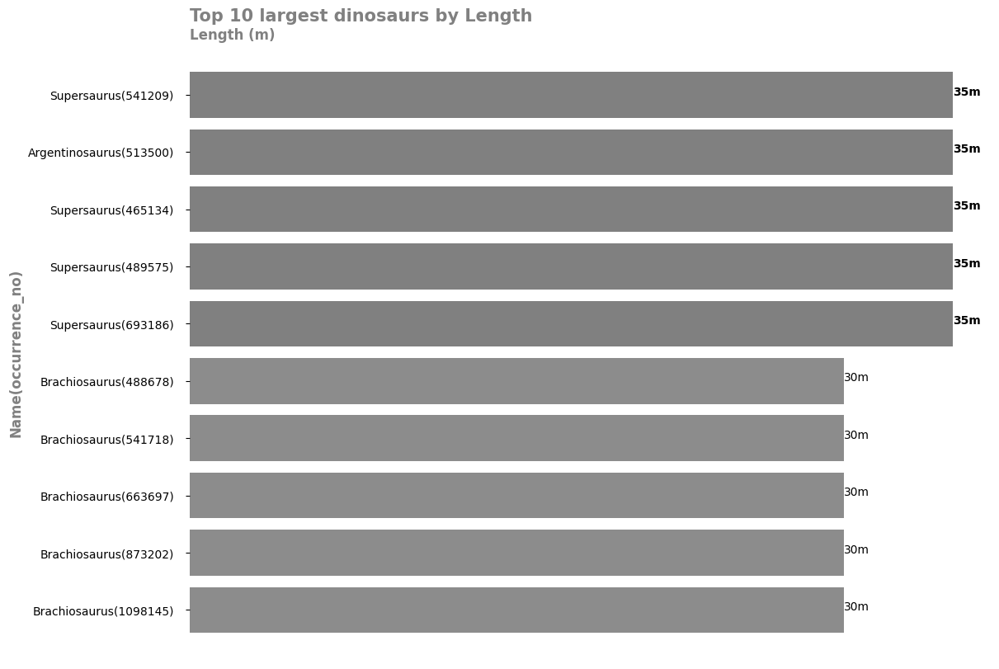

,occurrence_no,name,diet,type,length_m,max_ma,min_ma,region,lng,lat,class,family
1165,513500,Argentinosaurus,herbivorous,sauropod,35.0,99.6,89.8,Neuquén,-69.059998,-38.916672,Saurischia,NaN


In [7]:
# returns alpha value based on the normalized value
def colors_with_alpha(val, color):
    max_val = max(val)
    alpha_val = [ round(i / max_val, 1) for i in val ] # normalizes val
    return list(zip([color for _ in val], alpha_val))

#top ten largest dinosaurs
dino_data_length = dino_data.sort_values(by=["length_m"], ascending=False)[:10]

# the figure and axes containing the bar chart
fig, axes = plt.subplots(figsize = (12, 8), layout = 'constrained')

# formatting y_ticks(name(occurrence_no)) and setting values for the x-axis
y = dino_data_length.apply(lambda i:f"{i['name']}({i['occurrence_no']})", axis = 1)
x = dino_data_length['length_m']

axes.barh(y, x, color= colors_with_alpha(x, 'grey')) #plots horizontal bar chart

# design the chart
axes.spines[['top', 'bottom', 'left', 'right']].set_visible(False)
axes.set_xticks([],labels='')
axes.yaxis.set_tick_params(pad = 10)
axes.xaxis.set_label_position('top')
axes.invert_yaxis()

# labels each bar with their length
for x_val, y_val in zip(x, y):
    if x_val == dino_data['length_m'].max():
        axes.text(x_val, y_val, f"{x_val:.0f}m", weight = 700)
    else:
        axes.text(x_val, y_val, f"{x_val:.0f}m")

# sets the title and y_label_name
axes.set_ylabel("Name(occurrence_no)", color= 'grey', size= 12,weight=700)
axes.set_xlabel("Length (m)", color= 'grey', size= 12,loc='left',weight=700)
axes.set_title("Top 10 largest dinosaurs by Length", weight= 700, size= 15, color= 'grey',loc='left')
plt.show()

# returns all entries with Argentinosaurus name
dino_data[dino_data["name"] == "Argentinosaurus"]

In [8]:
# returns all entries with Supersaurus name
dino_data[dino_data["name"] == "Supersaurus"]

,occurrence_no,name,diet,type,length_m,max_ma,min_ma,region,lng,lat,class,family
570,465134,Supersaurus,herbivorous,sauropod,35.0,155.7,145.0,Colorado,-108.397202,38.583099,Saurischia,Diplodocidae
924,489575,Supersaurus,herbivorous,sauropod,35.0,155.7,145.0,Estremadura,-9.343696,39.216393,Saurischia,Diplodocidae
1423,541209,Supersaurus,herbivorous,sauropod,35.0,157.3,145.0,Colorado,-109.036133,39.200081,Saurischia,Diplodocidae
1972,693186,Supersaurus,herbivorous,sauropod,35.0,157.3,145.0,Wyoming,-105.439041,42.629375,Saurischia,Diplodocidae


'366 (35.12)% of the dinosaurs lacking information on family, length, diet and type'

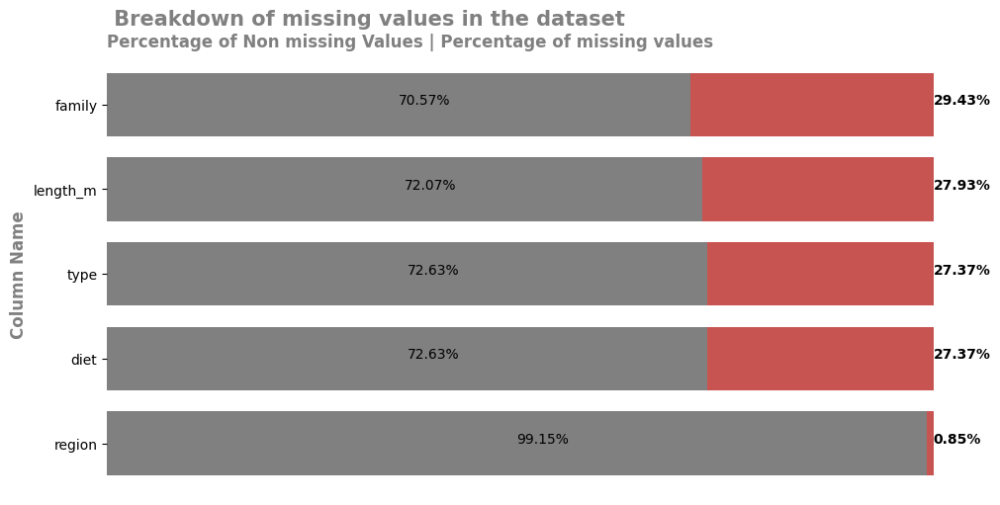

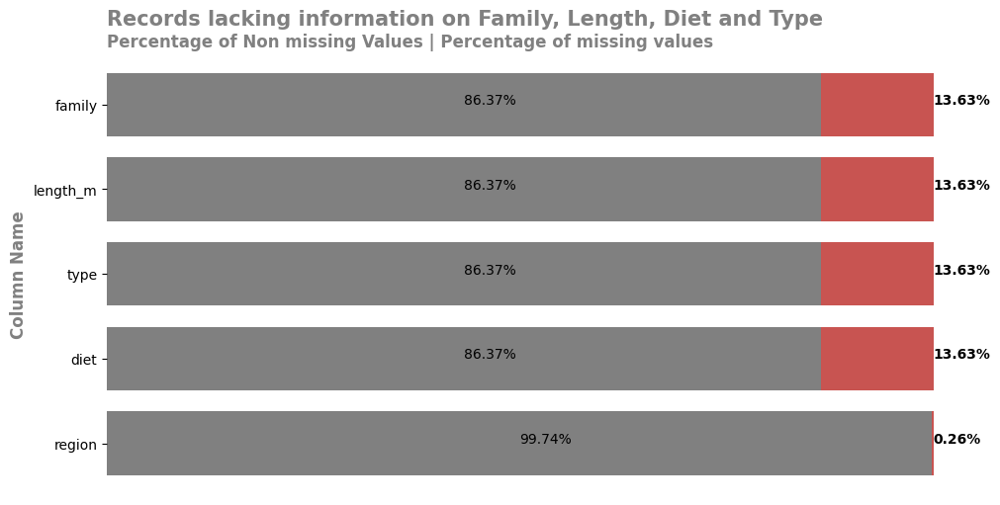

In [9]:
# enables customization of ticks
import matplotlib.ticker as ticker

# visaulizes the percentage of null values
def vis_null_values(data, y_l, tit,x_lbl = ''):
    x_lbl = 'Percentage of Non missing Values | Percentage of missing values' if x_lbl == '' else x_lbl
    fig, axes = plt.subplots(figsize= (10, 5), layout='constrained')
    data = data[data != 100] 

    axes.barh(y=data.index, width=[100 for i in data.index], height=0.75, color="#C85451")

    axes.barh(y=data.index, width=data, height=0.75, color='grey')
    axes.spines[["top", "bottom", "right", "left"]].set_visible(False)
    for x_val, y_val in zip(data, data.index):
        axes.text(x_val/2, y_val, f"{x_val}%")
        null_percent = round(100 - x_val, 2)
        axes.text(100, y_val, f"{null_percent}%", weight=700)
    axes.set_ylabel(ylabel=y_l, color='grey', weight=700,size=12)
    axes.set_xlabel(x_lbl, color='grey', weight=700,loc='left',size=12)
    axes.xaxis.set_label_position('top')
    axes.xaxis.set_major_formatter(ticker.NullFormatter())
    axes.xaxis.set_major_locator(ticker.NullLocator())
    axes.set_title(tit, color='grey', weight=700,loc='left',size=15)


get_percent = lambda data, all_data : round((data.notnull().sum(axis=0) / all_data.shape[0] ) * 100, 2)


#computes the relative size of missing values and visualizes it
not_null_columns_percent = get_percent(dino_data, dino_data)
not_null_columns_percent = not_null_columns_percent.sort_values(ascending=False)
vis_null_values(not_null_columns_percent, "Column Name", " Breakdown of missing values in the dataset")


#relative size of entries lacking information on family, length, diet and type
all_null = dino_data[(dino_data['length_m'].isnull()) & (dino_data['family'].isnull()) & (dino_data['type'].isnull()) & (dino_data['diet'].isnull())]
all_null_percent =100 - round((all_null.isnull().sum(axis=0) / dino_data.shape[0] ) * 100, 2)
all_null_percent = all_null_percent.sort_values(ascending=False)
vis_null_values(all_null_percent, 'Column Name', 'Records lacking information on Family, Length, Diet and Type')

#dinosaur not having enough information
null_dinos_no = all_null['name'].unique().shape[0]
f"{null_dinos_no} ({round(null_dinos_no / dino_data['name'].unique().shape[0] * 100, 2)})% of the dinosaurs lacking information on family, length, diet and type"



#### 3. What dinosaur type has the most occurrences in this dataset? Create a visualization (table, bar chart, or equivalent) to display the number of dinosaurs per type.
The most common dinosaur type in the dataset is the **ornithopods**, constituting **22.6%** of the entire dataset. Ornithopods are primarily **herbivorous animals** with an **average length of 7.14 meters**. This diverse group comprises **eight families**, with the most dominant family being **Hadrosauridae**.

The oldest fossil of an ornithopod was discovered **228 million years ago**, while the most recent fossils date back to **66 million years ago**. The majority of these fossils were excavated in **Montana**.

Interestingly, all records of the ornithopod class belong to the **Ornithischia** subclass, except for the dinosaur **Pantydraco**, which belongs to the **Saurischia** subclass. While initially, there may have been assumptions that Pantydraco's class assignment was incorrect, it has been verified through reliable sources such as [this article](https://thedinosaurs.org/dinosaurs/pantydraco).

The largest type is ornithopod
ornithopods are herbivorous animals
Average length of ornithopod is 7.135633626097867
Oldest record found : 228.0
 Earliest record found: 66.0
class
Ornithischia    810
Saurischia        1
Name: count, dtype: int64


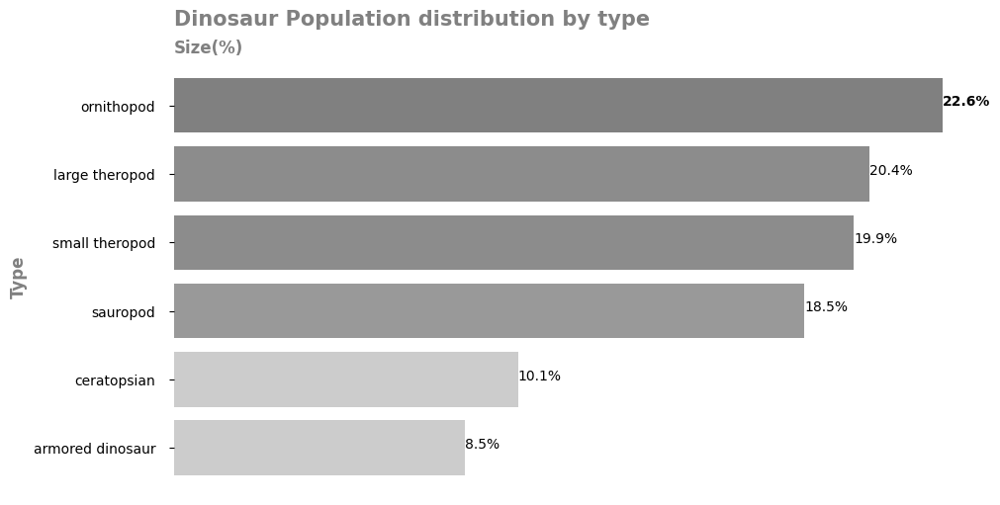

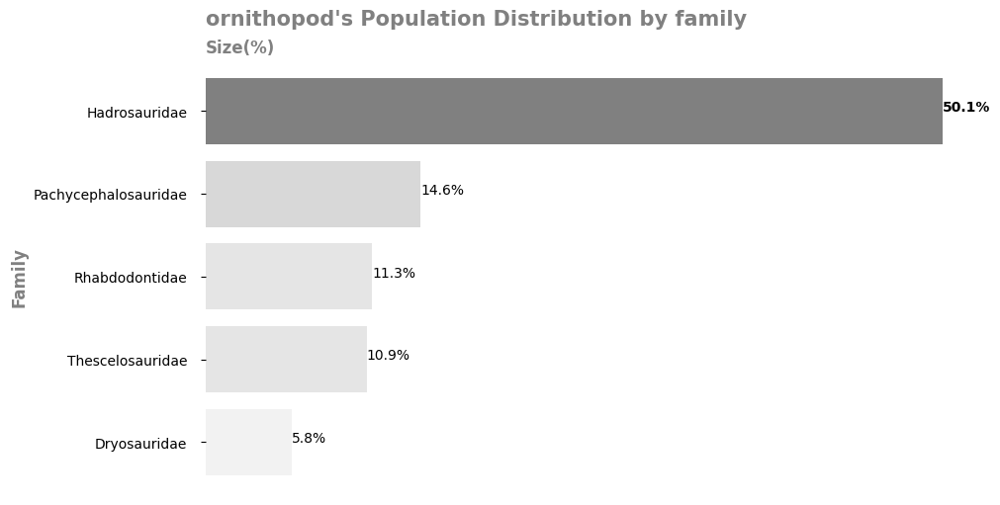

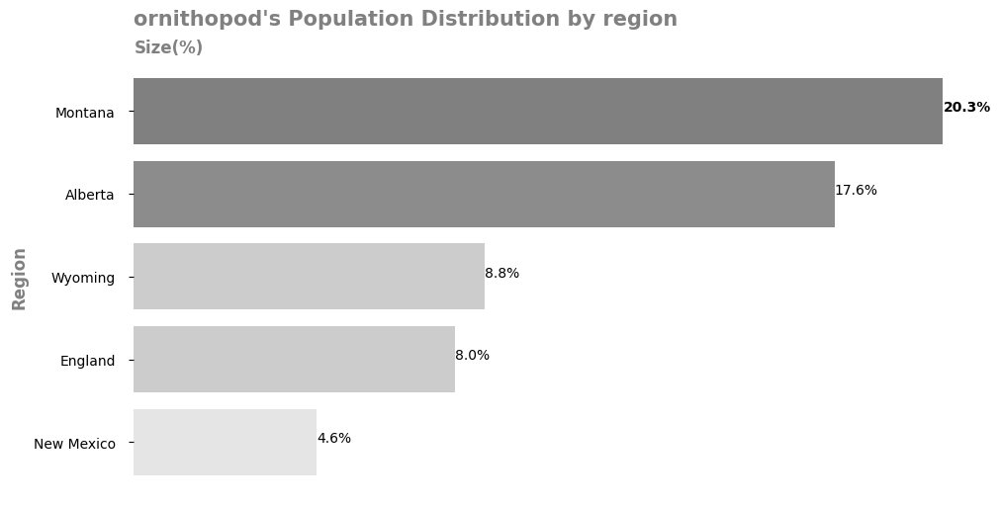

In [10]:
# plot horizontal bar chart
def plot_barh(data, title, lbls, prefix ='' , suffix='%'):
    fig, axes = plt.subplots(figsize=(10, 5), layout='constrained')
    axes.barh(data.index, data.values, color= colors_with_alpha(data, 'grey'))
    axes.spines[['top',  'bottom',  'left',  'right']].set_visible(False)
    axes.spines['bottom'].set_visible(False)
    # xaxis.set_visible(False)
    axes.set_xticks([],labels='')
    axes.yaxis.set_tick_params(pad=10)
    axes.invert_yaxis()
    axes.text(data.values[0], data.index[0], f"{prefix}{data.values[0]:.1f}{suffix}", weight=900)
    for x_val, y_val in zip(data.values[1:], data.index[1:]):
        axes.text(x_val, y_val, f"{prefix}{x_val:.1f}{suffix}")
    axes.set_xlabel(lbls[0],weight=700,color='grey',loc='left',size=12)
    axes.set_ylabel(lbls[1], weight=700, color='grey',size=12)
    axes.xaxis.set_label_position('top')
    axes.set_title(title, weight=700, color='grey', size=15,loc='left',pad=10)
    


# get the most populated type, along with its relationship with other columns
dino_per_type = (dino_data["type"].value_counts() / dino_data["type"].value_counts().sum()) * 100
largest_type = dino_per_type.index[0]
dino_large_type = dino_data[dino_data['type'] == largest_type]
family_pop = ((dino_large_type['family'].value_counts() / dino_large_type['family'].value_counts().sum()) * 100)[:5]
region_pop = ((dino_large_type['region'].value_counts() / dino_large_type['region'].value_counts().sum()) * 100)[:5]
dino_large_type[dino_large_type['class'] == 'Saurischia']


print(f"The largest type is {largest_type}")
print(f"{largest_type}s are {dino_large_type['diet'].value_counts().index[0]} animals")
print(f"Average length of {largest_type} is {dino_large_type['length_m'].mean()}")
print(f'Oldest record found : {dino_large_type['max_ma'].max()}\n Earliest record found: {dino_large_type['min_ma'].min()}')
print(dino_large_type['class'].value_counts())



plot_barh(dino_per_type,"Dinosaur Population distribution by type", ["Size(%)","Type"])
plot_barh(family_pop, f"{largest_type}'s Population Distribution by family", ["Size(%)","Family"])
plot_barh(region_pop, f"{largest_type}'s Population Distribution by region", ["Size(%)","Region"])


#### 4. Did dinosaurs get bigger over time? Show the relation between the dinosaur length and their age to illustrate this.

Initially, the correlation coefficient between the dinosaur's length and the average age was found to be **+0.31**, indicating a **moderate positive relationship**. This means that longer dinosaur lengths are associated with higher ages. However, in the context of ages, a **higher age** represents an **older time period**, and a **lower age** represents a more **recent time period**. Therefore, this positive correlation suggests that, over time, the length of dinosaurs decreased.

To further analyze this relationship, the dinosaur's age was grouped into ranges based on the official age periods defined by the [Natural History Museum (NHM)](https://www.nhm.ac.uk/discover/when-did-dinosaurs-live.html): 

- **Cretaceous (145-66 million years ago)**
- **Jurassic (201-145 million years ago)**
- **Triassic (257-201 million years ago)**

These periods were represented as 0, 1, and 2, respectively.

After grouping the ages into these ranges, the correlation coefficient was recalculated and found to be **+0.36**. This recalculated value still indicates a moderate positive relationship between dinosaur length and age, even when considering the grouped age ranges. Therefore, the analysis supports the idea that dinosaurs generally decreased in size over time.

The correlation between dinosaur's length and average age is 0.31
The age range of dinosaur falls between 68.3 and 249.685
The correlation between dinosaur's length and era is 0.36


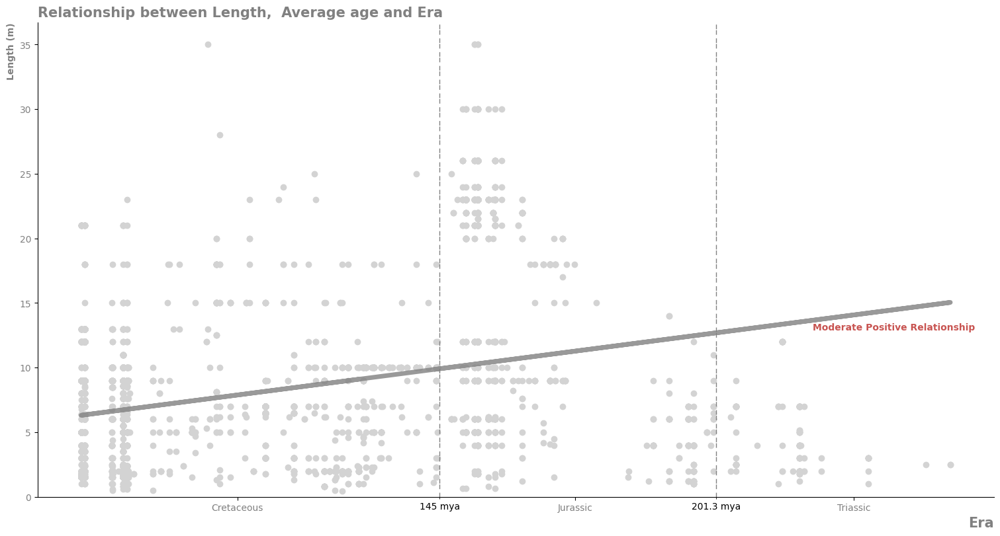

In [11]:
import matplotlib.patches as patches
from matplotlib import ticker
import matplotlib.colors as mcolors
# returnd the correlation coefficient columns
def get_corr(data, cols):
    corr_coeff = data.corr(numeric_only=True)
    return corr_coeff[[True if i in cols else False for i in corr_coeff.index]][cols]

#classifies the age into era
def classify_period(min_rec):
    if 252.17 >= min_rec and 201.3 <= min_rec:
        # "Triassic"
        return 2
    elif 201.3 >= min_rec and 145 <= min_rec:
        # "Jurassic"
        return 1
    if 145 >= min_rec and 66 <= min_rec:
        # "Cretaceous"
        return 0

# line plot with line of best fit
def length_era(data, ax):
    data = data[data['length_m'].notnull()]
    up_b_min_ma = []
    maj_x_tick = {'formatter' : [], 'locator':["Cretaceous", "Jurassic", "Triassic"]}
    min_x_tick = {'formatter' : [], 'locator' : ['145 mya', '201.3 mya']}


    for period in data["era"].unique():
        data_p = data[data["era"] == period]
        ax.scatter(data_p["mean_ma"], data_p["length_m"], c='lightgrey')
        up_b_min_ma.append(data_p["mean_ma"].max())

    start_x = ax.get_xlim()[0]
    up_b_min_ma[-1] = ax.get_xlim()[1]
    max_y = ax.get_ylim()[1]
    ax.set_ylim(0, max_y)

    # line of best fit
    m, c = np.polyfit(data['mean_ma'], data['length_m'], 1)
    y_pred = data['mean_ma'].apply(lambda x: (m * x) + c)
    
    # boundaries for each era
    for ind, u_bound in enumerate(up_b_min_ma):
        maj_x_tick["formatter"].append((u_bound + start_x)/2)
        start_x = u_bound
        if ind != len(up_b_min_ma)-1:
            min_x_tick["formatter"].append(start_x + 0.5)
            patch = patches.Rectangle((start_x + 0.5, 0), 0, max_y, color='grey', fill=False, ls=(0, (5, 10)))
            ax.add_patch(patch)

 
    axes.plot(data['mean_ma'], y_pred, c='grey',lw=5,alpha=0.8)
    max_x = data['mean_ma'].max()
    max_y_pred = (m * max_x) + c
    axes.annotate(xy=(max_x, max_y_pred), xytext=(-150, -30), text="Moderate Positive Relationship", weight=700, textcoords='offset points', c="#C85451")
    ax.spines[['top', 'right']].set_visible(False)

    ax.xaxis.set_major_locator(ticker.FixedLocator(maj_x_tick['formatter']))
    ax.xaxis.set_major_formatter(ticker.FixedFormatter(maj_x_tick["locator"]))

    ax.xaxis.set_minor_locator(ticker.FixedLocator(min_x_tick["formatter"]))
    ax.xaxis.set_minor_formatter(ticker.FixedFormatter(min_x_tick["locator"]))

    ax.set_xlabel("Era", weight=700, color='grey', size=15,loc='right')
    ax.set_ylabel('Length (m)', weight=700, color='grey',loc='top')

    ax.tick_params('both', labelcolor='grey')


fig, axes = plt.subplots(figsize=(15, 8), layout='constrained')
axes.set_title("Relationship between Length,  Average age and Era", weight=700, color='grey', loc='left',size=15)

#classify the mean age of each entries
dino_data['mean_ma'] = (dino_data['max_ma'] + dino_data['min_ma']) /2
era_list = ['Cretaceous', 'Jurassic', 'Triassic']
dino_data["era"] = dino_data['mean_ma'].apply(lambda i: classify_period(i))

print(f"The correlation between dinosaur's length and average age is {get_corr(dino_data, ['length_m', 'mean_ma'])['mean_ma'].values[0]:.2f}")
print(f'The age range of dinosaur falls between {dino_data['mean_ma'].min()} and {dino_data['mean_ma'].max()}')
print(f"The correlation between dinosaur's length and era is {get_corr(dino_data, ['length_m', 'era'])['era'].values[0]:.2f}")

length_era(dino_data, axes)

plt.show()


#### 5. Use the AI assitant to create an interactive map showing each record.
Based on the map, **most fossil records** are found in **North America**, with the region having the highest number of dinosaur records being **Alberta**, which boasts **650 fossil records**. This indicates a significant concentration of dinosaur fossils in this area.

Additionally, there is an **outlier** present on the map, located far to the right, which is assigned to the region of **England**.

In [12]:
import folium
from folium.plugins import MarkerCluster, GroupedLayerControl

# colors for each grouped markers
col =  ['red', 'blue', 'gray', 'darkred', 'orange', 'green', 'black', 'darkgreen', 'darkblue', 'purple']
rng_col =lambda: '#' + ''.join(np.random.choice(col.split(', '), 6))

#adds marker to the map
def add_marker(inst, clust, col=None):
    mark = folium.Marker(
        location= [inst['lat'], inst['lng']], 
        popup = f'Name: {inst['name']}\nRegion: {inst['region']}\nEra: {era_list[inst['era']]}', 
        )
    if col != None:
        mark = folium.Marker(
        location= [inst['lat'], inst['lng']], 
        popup = f'Name: {inst['name']}\nRegion: {inst['region']}\nEra: {era_list[inst['era']]}', 
        icon=folium.Icon(color=col)
        )
    clust.add_child(mark)

#makes the map
def make_map(data):
    map = folium.Map(location=[data['lat'].mean(),  data['lng'].mean()],  zoom_start=0)
    used_color = []
    all_r = folium.FeatureGroup(name='All regions', overlay=False, show=True)
    top_10 = folium.FeatureGroup(name='Top 10 regions by population', overlay=False, show=True)
    for ind, reg in enumerate(data['region'].value_counts().index):
        cluster_all =MarkerCluster()
        used_color.append(col)
        data[data['region'] == reg].apply(lambda i: add_marker(i, cluster_all), axis=1)
        all_r.add_child(cluster_all)
        if ind < 10:
            cluster_10 = MarkerCluster()
            data[data['region'] == reg].apply(lambda i: add_marker(i, cluster_10, col[ind]), axis=1)
            top_10.add_child(cluster_10)
    map.add_child(all_r)
    map.add_child(top_10)
    GroupedLayerControl(
        groups={'Groups': [top_10, all_r]}, 
        collapsed=False, 
    ).add_to(map)
    return map
make_map(dino_data)


#### 6 Other insights you found during analysis?

##### 6.1 Do All Dinosaur Types Exhibit a Positive Correlation Between Length and Age?

In general, the correlation between dinosaur length and average age is a moderate positive correlation (+0.31). However, not all dinosaur types follow this trend. Specifically:

- **Ceratopsians** have a negative correlation of -0.69.
- **Sauropods** have a negative correlation of -0.37.
- **Ornithopods** have a negative correlation of -0.15.

This means that for these three types, the correlation is not only negative, but ceratopsians exhibit the highest magnitude of this negative correlation. In practical terms, this indicates that from the oldest (Triassic) to the most recent (Cretaceous) eras, the length of ceratopsians, sauropods, and ornithopods actually increased, contrary to trends observed across other dinosaur types.

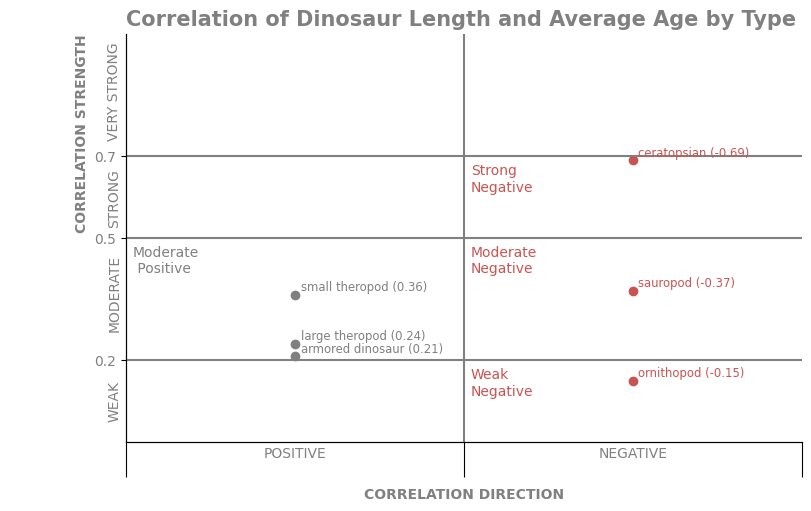

In [13]:
# get the correlation coefficient between length and average age by type
dino_types = dino_data['type'].value_counts().index
corr_type = []
for d_type in dino_types:
        data = dino_data[dino_data['type'] == d_type]
        corr_type.append(round(get_corr(data, ['length_m', 'mean_ma'])['mean_ma'].values[0], 2))
type_coeff = pd.Series(corr_type, index=dino_types)

#returns the interpretation of correlation coefficient
def interpret(lbound, direction = None):
    dec = ''
    if lbound == 0:
        dec += 'Weak'
    elif lbound == .2:
        dec += 'Moderate'
    elif lbound == .5:
        dec += 'Strong'
    elif lbound == .7:
        dec += 'Very Strong'
    return dec + '\n Positive' if direction else dec + '\nNegative'

#maps the x,y,label,color for each type 
coeff = [0, .2, .5, .7]
highlight = dict()
for direction in [False, True]:
    data = type_coeff[type_coeff > 0]if direction else type_coeff[type_coeff < 0]
    for ind, low_bound in enumerate(coeff):
        c_range = coeff[ind+1] -low_bound if ind != len(coeff) -1 else 1 - low_bound
        f = data[(abs(data) >= low_bound) & ((abs(data) - low_bound) <= c_range)]
        if f.shape[0] >= 1:
            y = low_bound + c_range
            x = 0 if direction else 0.5
            c = 'grey' if direction else '#C85451'
            if (x, y) not in list(highlight.keys()):
                highlight[(x, y, c)] = interpret(low_bound, direction)

# design of the line graph
coeff_y = [0.2, 0.5, 0.7]
fig,  axes = plt.subplots(figsize=(8, 5), layout='constrained')
axes.set_ylim(0, 1)
axes.set_xlim(0, 1)
axes.set_yticks(coeff_y, labels=coeff_y, color='grey')
axes.set_xticks([0, 0.5, 1], ['', '', ''])
axes.tick_params('x', length=25)
axes.axvline(x=0.5, color='grey')

y_lbl = ['\n\nWEAK', '\n\n\n\n\nMODERATE', '\n\n\nSTRONG', '\n\n\n\n\n\nVERY STRONG']
y_ticks = [0.1, 0.35, 0.6, 0.85]
y_sec = axes.secondary_yaxis(location=0)
y_sec.set_yticks(y_ticks, labels=y_lbl, color='grey', rotation=90)
y_sec.tick_params('y', size=0)

x_lbl = ['POSITIVE', 'NEGATIVE']
x_ticks = [0.25, 0.75]
x_sec = axes.secondary_xaxis(location=0)
x_sec.set_xticks(x_ticks, labels=x_lbl)
x_sec.tick_params('x', labelcolor='grey', size=0)

for c in coeff_y:
    axes.axhline(y=c, color='grey')

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)

axes.set_ylabel('CORRELATION STRENGTH', weight=700, color='grey',loc='top')
axes.set_xlabel('CORRELATION DIRECTION', weight=700, color='grey')

pos_type_coeff = type_coeff[type_coeff > 0]
neg_type_coeff = abs(type_coeff[type_coeff < 0])


axes.scatter([0.25 for _ in pos_type_coeff], pos_type_coeff.values, c='grey')
axes.scatter([0.75 for _ in neg_type_coeff], neg_type_coeff.values, c="#C85451")
x = 0.25
c='grey'
dir = 1
for values in [pos_type_coeff, neg_type_coeff]:
    for lbl, y in values.items():
        axes.annotate(xy=(x, y), xytext=(4, 3), text=lbl+f' ({dir * y})', textcoords='offset points', color=c, fontsize='small')
    x += 0.5
    c = '#C85451'
    dir = -1


for coord, lbl in highlight.items():
    axes.annotate(xy=(coord[0], coord[1]), xytext=(5, -25), text=lbl, textcoords='offset points', c=coord[2])

axes.set_title('Correlation of Dinosaur Length and Average Age by Type',  weight=700,  color='grey',loc='left',size=15)
plt.show()

##### 6.2 Average Length by Type, Diet, and Family

When examining the dataset for average length, the following patterns emerge:

- **Type with the highest average length:** Sauropods
- **Diet associated with the highest average length:** Herbivorous
- **Family with the highest average length:** Brachiosauridae

These features are consistent with the characteristics of the largest dinosaurs, with the exception of the family ranking. Notably, the families **Diplodocidae** and **Titanosauridae**, which were the family of Supersaurus and Argentinosaurus respectively,they ranked 2nd and 10th in average length, respectively. Despite these individual giants, their families do not hold the top spot for average length.

Interestingly, the third largest dinosaur, Brachiosaurus, belongs to the **Brachiosauridae family**, which does have the highest average length among families. This highlights the significant variation in size even within families known for their large members.

name
Giraffatitan     42
Brachiosaurus    16
Cedarosaurus      2
Europasaurus      2
Sonorasaurus      1
Lusotitan         1
Venenosaurus      1
Vouivria          1
Abydosaurus       1
Name: count, dtype: int64

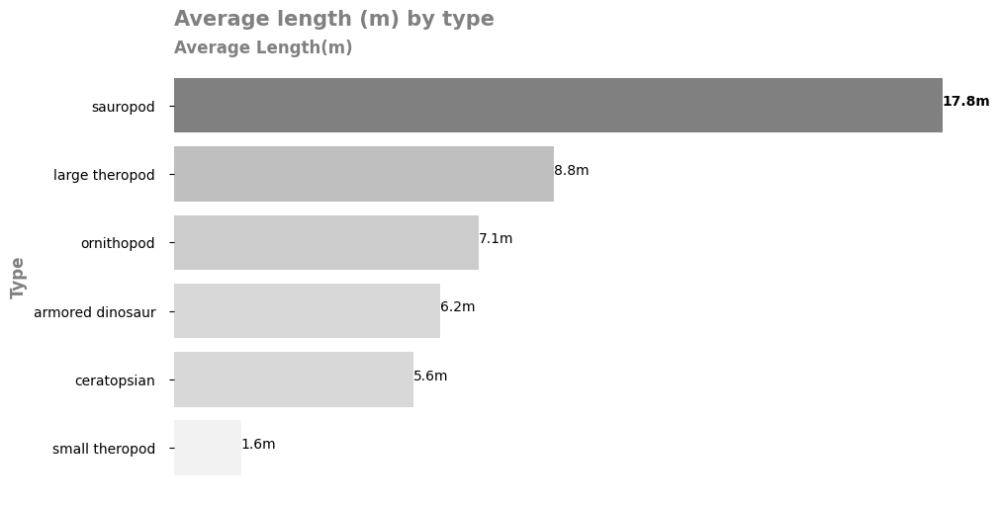

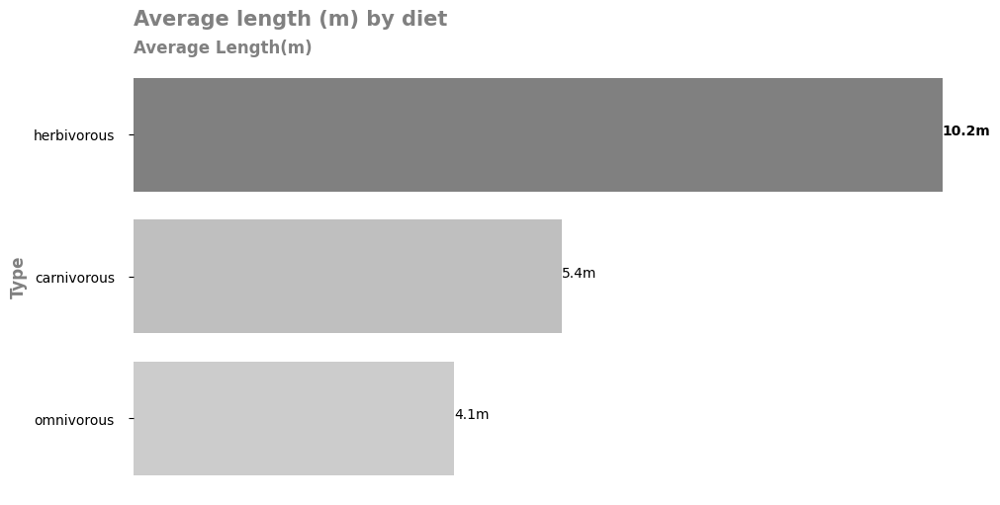

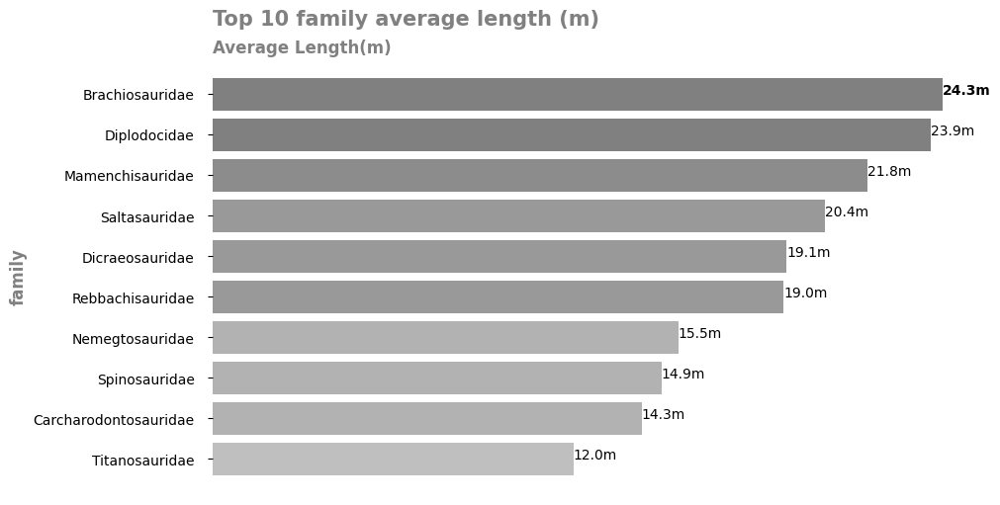

In [14]:
#calculates the mean for data with frequencies
def f_mean(inst):
    x = inst[inst != 0]
    total = 0
    for ind, val in zip(x.index, x.values):
        total += int(ind) * val
    return total/x.sum()

def f_max(inst):
    x = inst[inst != 0]
    return max(x.index)

def f_min(inst):
    x = inst[inst != 0]
    return min(x.index)

# average length by type
type_n_length = pd.crosstab(dino_data['type'], dino_data['length_m'])
avg_length = type_n_length.apply(lambda i: f_mean(i), axis=1)
avg_length = avg_length.sort_values(ascending=False)
plot_barh(avg_length, 'Average length (m) by type', ['Average Length(m)','Type'], suffix='m')

# average length by diet
diet_n_length = pd.crosstab(dino_data['diet'], dino_data['length_m'])
avg_length = diet_n_length.apply(lambda i: f_mean(i), axis=1)
avg_length = avg_length.sort_values(ascending=False)
plot_barh(avg_length, 'Average length (m) by diet',['Average Length(m)','Type'], suffix='m')

# average length by family
family_n_length = pd.crosstab(dino_data['family'], dino_data['length_m'])
avg_length = family_n_length.apply(lambda i: f_mean(i), axis=1)
avg_length = avg_length.sort_values(ascending=False)
plot_barh(avg_length[:10], 'Top 10 family average length (m)', ['Average Length(m)','family'], suffix='m')

# population distribution of dinosaurs belonging to Brachiosauridae
dino_data[dino_data['family'] == 'Brachiosauridae']['name'].value_counts()


##### 6.3 Identifying the Family with the Highest Population

The family **Dromaeosauridae** has the **highest population** among the dinosaur families in the dataset. These dinosaurs are primarily **carnivorous** and have an **average length of 1.71 meters**, classifying them mostly as **small theropods**, though some members are large theropods. They belong to the **Saurischia class**.

The oldest fossil record of Dromaeosauridae dates back to **157.3 million years ago (Jurassic era)**, and their most recent records are from **66 million years ago (Cretaceous era)**. Notably, most of these records were found in Alberta.

Interestingly, despite their high population, no fossil records of Dromaeosauridae were found from the Triassic era. This family emerged during the Jurassic era and flourished during the Cretaceous era.

The largest fam is Dromaeosauridae
Dromaeosauridaes are carnivorous animals
Average length of Dromaeosauridae is 1.71m
Oldest record found : 157.3
 Earliest record found: 66.0
class
Saurischia    450
Name: count, dtype: int64
era
0    448
1      2
Name: count, dtype: int64


,occurrence_no,name,diet,type,length_m,max_ma,min_ma,region,lng,lat,class,family,mean_ma,era
146,284147,Utahraptor,carnivorous,large theropod,6.0,129.40,125.00,Utah,-109.567902,38.826099,Saurischia,Dromaeosauridae,127.200,0
147,284613,Utahraptor,carnivorous,large theropod,6.0,125.45,122.46,Utah,-109.691666,38.718056,Saurischia,Dromaeosauridae,123.955,0
1391,537891,Achillobator,carnivorous,large theropod,5.0,100.50,83.60,Dornogov,109.858887,44.340000,Saurischia,Dromaeosauridae,92.050,0


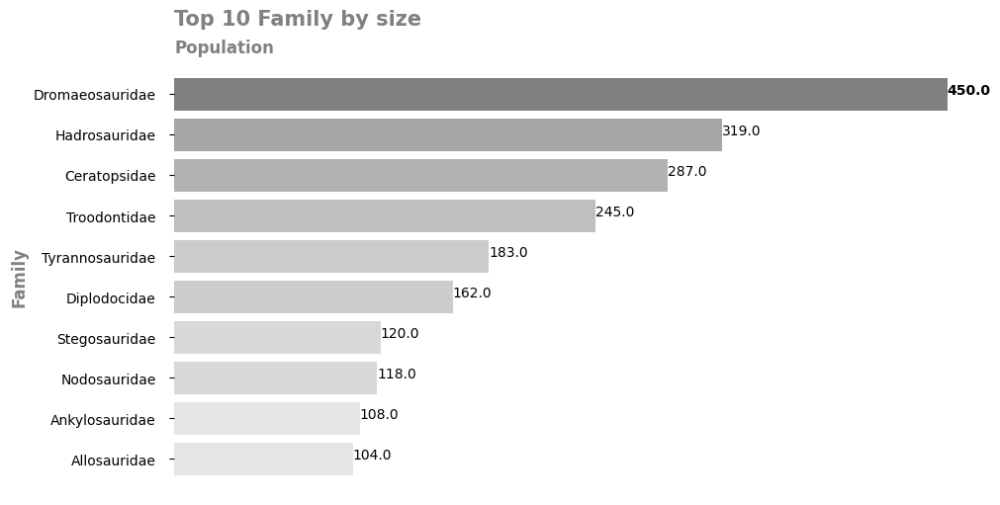

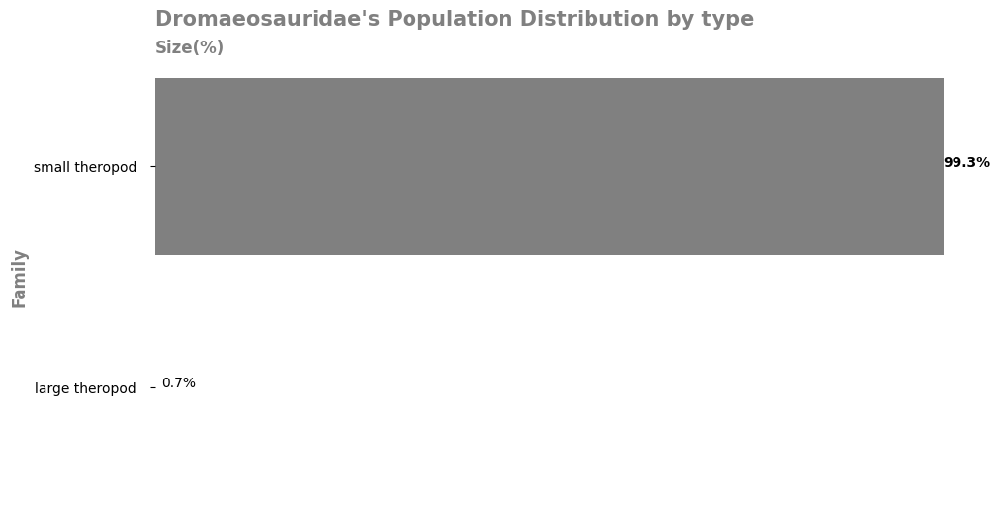

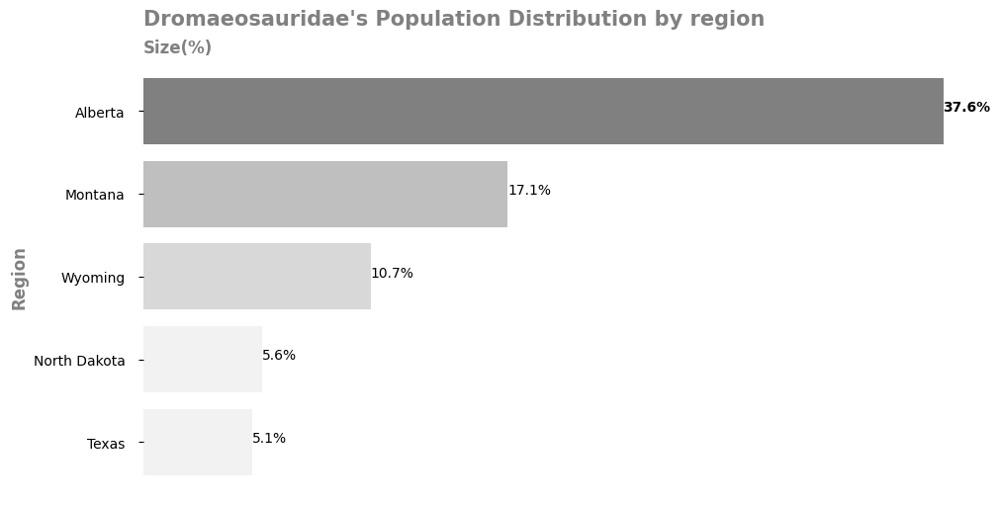

In [15]:
# filtering the most recorded family
dino_fam = dino_data['family'].value_counts()
largest_fam = dino_fam.index[0]
dino_large_fam = dino_data[dino_data['family'] == largest_fam]

# other analysis with the family
print(f"The largest fam is {largest_fam}")
print(f"{largest_fam}s are {dino_large_fam['diet'].value_counts().index[0]} animals")
print(f"Average length of {largest_fam} is {round(dino_large_fam['length_m'].mean(), 2)}m")
print(f'Oldest record found : {dino_large_fam['max_ma'].max()}\n Earliest record found: {dino_large_fam['min_ma'].min()}')
print(dino_large_fam['class'].value_counts())
print(dino_large_fam['era'].value_counts())

# plot representing the population distribution by family
plot_barh(dino_fam[:10], 'Top 10 Family by size', ['Population','Family'], suffix='')

# plot representing the population distribution by family
family_pop = ((dino_large_fam['type'].value_counts() / dino_large_fam['type'].value_counts().sum()) * 100)
plot_barh(family_pop, f"{largest_fam}'s Population Distribution by type", ["Size(%)","Family"])

# plot representing the population distribution by family
region_pop = ((dino_large_fam['region'].value_counts() / dino_large_fam['region'].value_counts().sum()) * 100)[:5]
plot_barh(region_pop, f"{largest_fam}'s Population Distribution by region", ["Size(%)","Region"])

dino_large_fam[dino_large_fam['type'] == 'large theropod']


#### 6.4 Patterns Found Between Diet, Type, and Family

##### Do All Dinosaur Types Have the Same Diet?
No, **small theropods, large theropods, and sauropods do not have the same diet across the dataset**. However, each type has a primary diet (highest percentage) and secondary diets.

##### Do All Dinosaur Families Have the Same Diet?
Out of the 75 different families, only **4 families do not have the same diet**. Therefore, most families have a consistent diet, with the exceptions being **Therizinosauridae, Oviraptoridae, Ornithomimidae, and Massospondylidae**. These families also have a primary diet (highest percentage) alongside other secondary diets.

##### Do All Dinosaur Families Have the Same Type?
Only **4 families do not follow this pattern**, which are **Troodontidae, Ornithomimidae, Herrerasauridae, and Dromaeosauridae**. Additionally, **Ornithomimidae** is the only family that does not have the same type and diet across all its members.

These patterns are essential in filling missing values for Type, diet

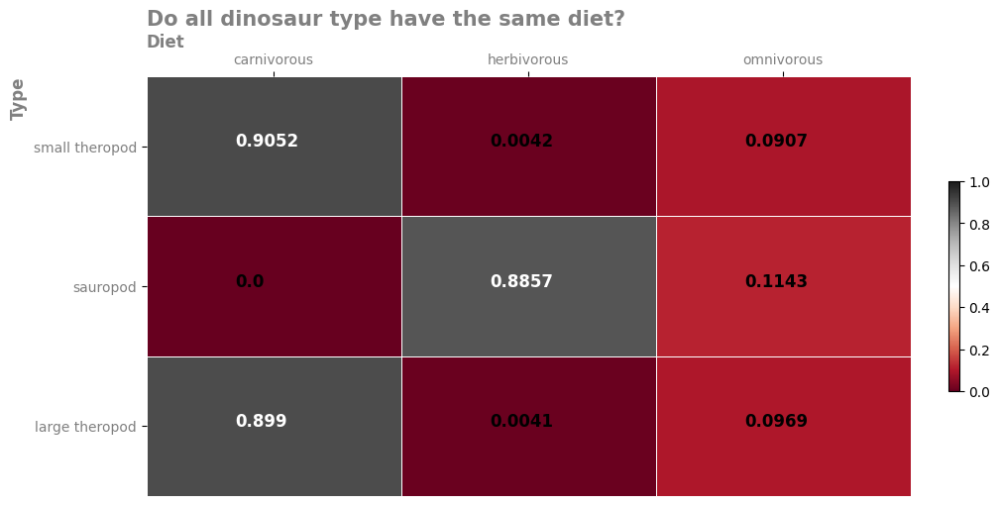

In [16]:
fig, axes = plt.subplots(figsize=(10, 5),  layout='constrained')
#plots heatmap
def plot_mesh(data, tit, fig, ax,lbls, dp=2, cbar=True, **meshkwargs):
    heat_m =ax.pcolormesh(data, cmap='RdGy', **meshkwargs)
    rows = np.arange(0.5, data.shape[0])
    cols = np.arange(0.5, data.shape[1])
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_major_locator(ticker.FixedLocator(cols))
    ax.xaxis.set_major_formatter(ticker.FixedFormatter(data.columns))
    ax.yaxis.set_major_locator(ticker.FixedLocator(rows))
    ax.yaxis.set_major_formatter(ticker.FixedFormatter(data.index))
    ax.spines[['top',  'left',  'right',  'bottom']].set_visible(False)
    ax.xaxis.set_label_position('top')
    ax.set_xlabel(lbls[0],loc='left',color='grey',weight=700,size=12)
    ax.set_ylabel(lbls[1],loc='top',color='grey',weight=700,size=12)
    query = lambda ind, col: round(data[data.index == data.index[ind]][data.columns[col]].values[0], dp)
    for y in rows:
        for x in cols:
            i, j = int(np.floor(y)), int(np.floor(x))
            val = query(i, j)
            if val <= 0.65:
                ax.text(x-0.15, y, val, color='black', fontsize='large', weight=900)
            else:
                ax.text(x-0.15, y, val, color='white', fontsize='large', weight=900)
    ax.set_title(tit, weight=700,loc='left',size=15,color='grey')
    ax.tick_params('both',labelcolor='grey')
    if cbar:
        fig.colorbar(heat_m, shrink=0.5)
    else:
        return heat_m

#normalized frequency table between type and diet
diet_type = pd.crosstab(dino_data['type'],  dino_data['diet'],  normalize=0)
diet_type = round(diet_type, 4)
diet_type_not_one = diet_type[diet_type.apply(lambda i : False if 1.0 in i.values else True, axis=1)]



# heatmap showing types with more than one diet
plot_mesh(diet_type_not_one, 'Do all dinosaur type have the same diet?', fig, axes,('Diet','Type') , dp=4, cbar=True, edgecolor='white',  lw=0.5, vmin=0, vmax=1)


plt.show()



We have 75 different families in the data set


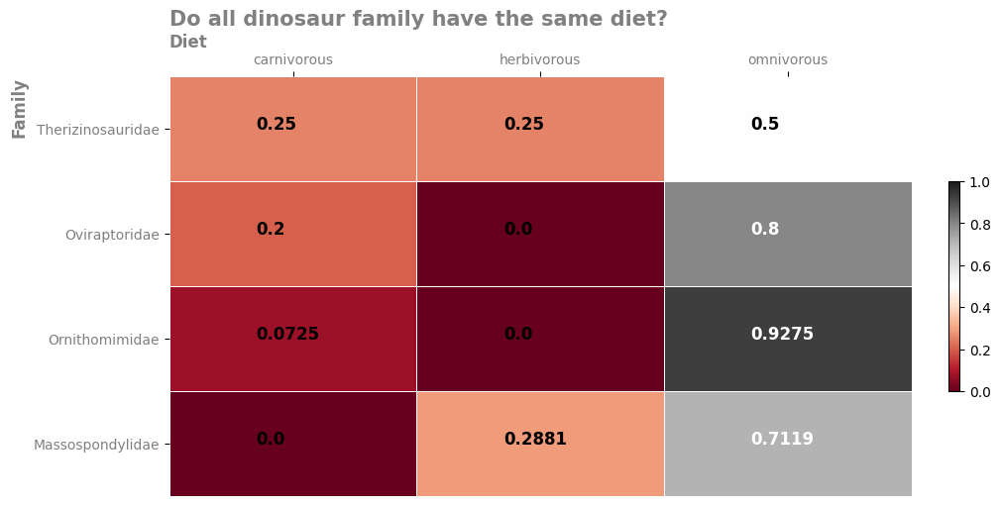

In [17]:
fig,ax = plt.subplots(figsize=(10,5), layout='constrained')
#normalized frequency table between type and diet
print(f'We have {dino_data['family'].value_counts().shape[0]} different families in the data set')
diet_family = pd.crosstab(dino_data['family'], dino_data['diet'], normalize=0)
diet_family = round(diet_family,4)
diet_family_not_one = diet_family[diet_family.apply(lambda i : False if 1.0 in i.values else True,axis=1)]


plot_mesh(diet_family_not_one,'Do all dinosaur family have the same diet?',fig,ax,('Diet','Family'),dp=4,cbar=True,edgecolor='white', lw=0.5,vmin=0,vmax=1)
plt.show()



We have 75 different families in the data set


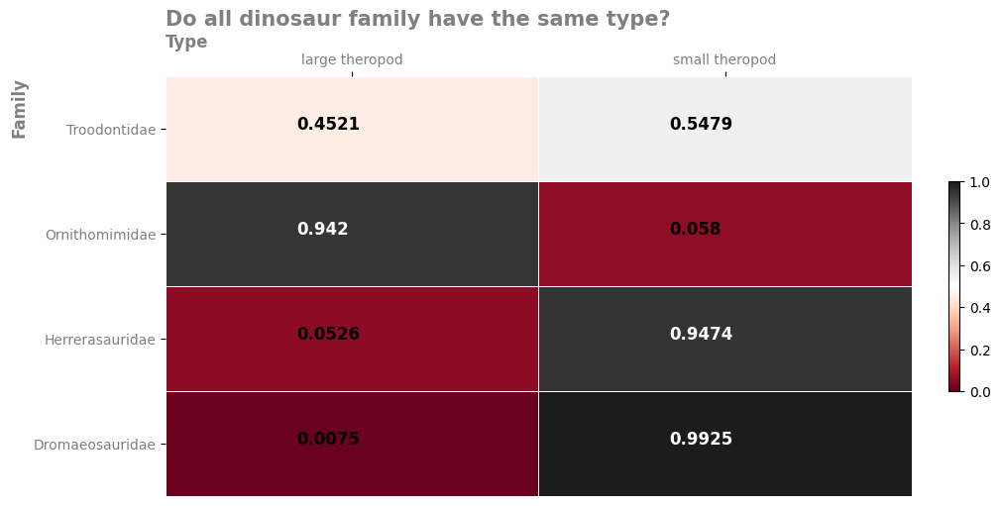

In [18]:
fig,ax = plt.subplots(figsize=(10,5), layout='constrained')
#normalized frequency table between type and diet
print(f'We have {dino_data['family'].value_counts().shape[0]} different families in the data set')
type_family = pd.crosstab(dino_data['family'], dino_data['type'], normalize=0)
type_family = round(type_family,4)
type_family_filtered = type_family[type_family.apply(lambda i : False if 1.0 in i.values else True,axis=1)]
not_null_columns = type_family_filtered.sum(axis=0)[type_family_filtered.sum(axis=0) > 0].keys()
type_family_filtered = type_family_filtered[not_null_columns]

plot_mesh(type_family_filtered,'Do all dinosaur family have the same type?',fig,ax,('Type','Family'),dp=4,cbar=True,edgecolor='white', lw=0.5,vmin=0,vmax=1)
plt.show()



##### 6.5 Comparing Dinosaur's Eras

The dataset primarily features dinosaurs from the **Cretaceous era (70%)**, with a much smaller representation from the **Triassic era (4.5%)**. This discrepancy is mainly because the **Triassic era is the oldest**, making **fossils harder to find**. Additionally, **most dinosaurs from the Triassic era are poorly known** (missing details like family, type, diet, and length) because the **excavated fossils are so ancient** that their **features are unidentifiable**. Due to the extensive population of the **Cretaceous period**, it accounts for **62% of the dinosaurs lacking essential information**, while the **Triassic era contributes only 10%**.

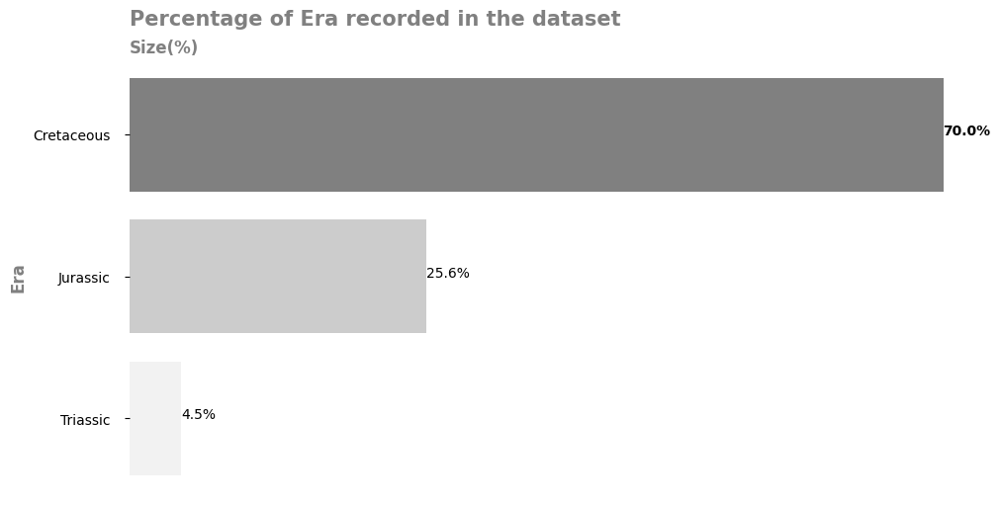

In [19]:

#relative size of each era in the dataset
era_size = dino_data['era'].value_counts()
era_size.index = era_list
era_size = round((era_size / dino_data.shape[0]) * 100, 2)
plot_barh(era_size, 'Percentage of Era recorded in the dataset', ['Size(%)','Era'], suffix='%')

# getting population of dinosaur lacking information in each era
unknown_dinos_within_era = []
unknown_dinos_pop_distr =[]
for era in dino_data['era'].unique():
    dino_by_era = dino_data[dino_data['era'] == era]
    unknown_dinos = dino_by_era[(dino_by_era['length_m'].isnull()) & (dino_by_era['diet'].isnull()) & (dino_by_era['type'].isnull()) & (dino_by_era['family'].isnull())]['name'].unique().shape[0]
    unknown_dinos_within_era.append(round(unknown_dinos / dino_by_era['name'].unique().shape[0] * 100, 2))
    unknown_dinos_pop_distr.append(round(unknown_dinos / null_dinos_no * 100, 2))


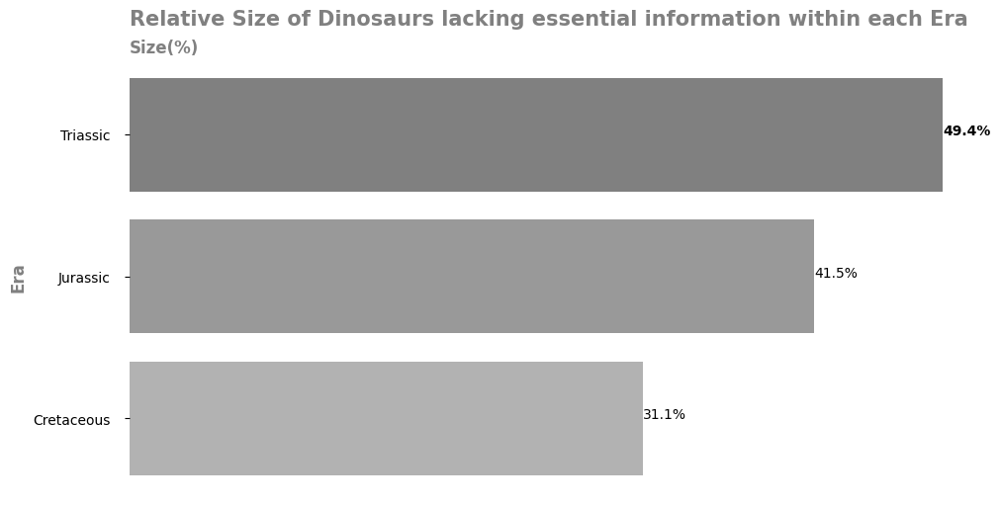

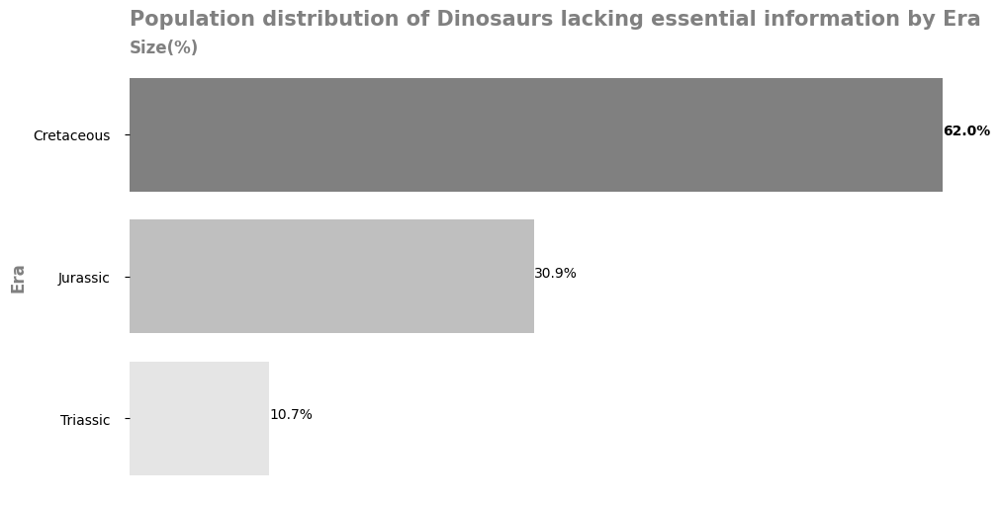

In [20]:

#plot of Relative Size of Dinosaurs lacking essential information within each Era
unknown_dinos_within_era = pd.Series(unknown_dinos_within_era, index=era_list).sort_values(ascending=False)
plot_barh(unknown_dinos_within_era, 'Relative Size of Dinosaurs lacking essential information within each Era', ["Size(%)",'Era'], suffix='%')

#plot of Population distribution of Dinosaurs lacking essential information by Era
unknown_dinos_pop_distr = pd.Series(unknown_dinos_pop_distr, index=era_list).sort_values(ascending=False)
plot_barh(unknown_dinos_pop_distr, 'Population distribution of Dinosaurs lacking essential information by Era', ["Size(%)",'Era'], suffix='%')


##### 6.6 Why is Jurassic Era is considered the golden age of dinosaurs?

The Jurassic era is often hailed as the golden age of dinosaurs, despite the **Cretaceous period** having the **highest number of different names and families of dinosaurs**. This distinction is rooted in several key factors that highlight the significance of the Jurassic era in dinosaur evolution.

Firstly, the **relative increase in** diversity from the **Triassic to the Jurassic** was substantially **larger** than the **increase** from the **Jurassic to the Cretaceous**. This means that during the **Jurassic era**, there was an **explosive growth** in the **number and variety of dinosaur species**. The Triassic era laid the groundwork, but it was the Jurassic that saw dinosaurs truly diversify and dominate the planet, filling a wide array of ecological niches.

Additionally, the change in the **average length of dinosaurs** from the **Jurassic** to the **Cretaceous declined**, indicating a reduction in size **compared to the dramatic growth** observed from the **Triassic to the Jurassic**. During the Jurassic period, dinosaurs reached some of their largest sizes, particularly with the emergence of gigantic sauropods and formidable large theropods. This era was marked by the peak of dinosaur gigantism, a key characteristic that underscores its status as the golden age.

However, it’s worth noting that not all dinosaur groups followed this trend. Ornithopods, for instance, experienced a decline in average length during the Jurassic, and the smaller theropods saw their highest transition in size from the Jurassic to the Cretaceous. These exceptions highlight the complex and varied evolutionary paths different dinosaur groups took.

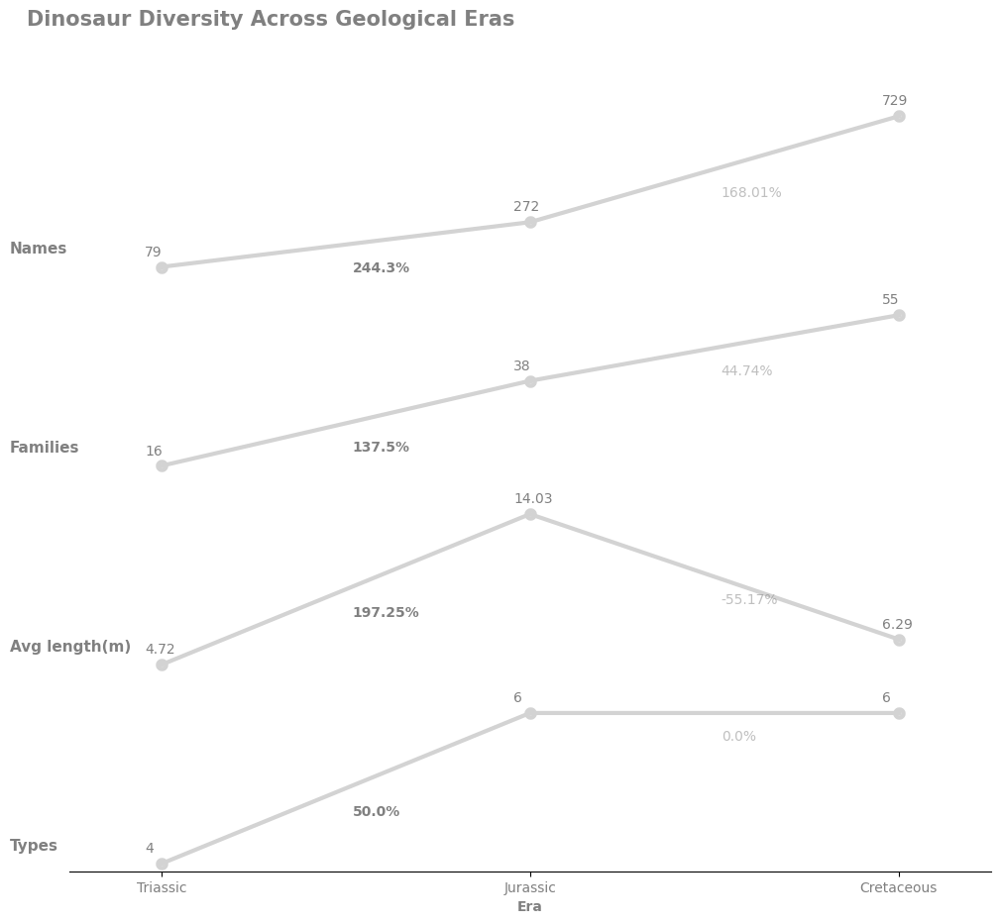

In [41]:
# line plot for era
def plot_era(ax, y_vals, change, units=''):
    x_vals = [.1, .5, .9]
    ax.set_xlim(0, 1)
    ax.set_xticks(x_vals, ['Triassic', 'Jurassic', 'Cretaceous'])
    ax.tick_params('x', labelcolor='grey')
    ax.spines[['top', 'left', 'right']].set_visible(False)
    ax.yaxis.set_visible(False)
    line = ax.plot(x_vals, y_vals, c='lightgrey', lw=3, marker='.', mew=6)
    ax.set_xlabel('Era', weight=900, color='grey')
    for x, y in zip(x_vals, y_vals):
        ax.annotate(xy=(x, y), text=f'{y}{units}', xytext=(-12, 8), textcoords='offset points', c='grey')
    for ind, (x, y, lbl) in enumerate(zip(x_vals[:-1], y_vals[:-1], change)):
        mid_x = (x + x_vals[ind + 1]) / 2
        mid_y = (y + y_vals[ind + 1]) / 2
        if lbl == max(change):
            ax.annotate(xy=(mid_x, mid_y), text=f'{lbl}%', xytext=(5, -20), textcoords='offset points', c='grey', weight='900')
        else:
            ax.annotate(xy=(mid_x, mid_y), text=f'{lbl}%', xytext=(5, -20), textcoords='offset points', c='grey',alpha=0.5)
    return line, x_vals
#returns the relative change trasitioning from an era to the other
def calc_rel_change(values):
    rel_change = []
    for ind, value in enumerate(values[:-1]):
        change = ((values[ind+1] - value) / value) * 100
        rel_change.append(round(change, 2))
    return rel_change

#list containing entries for each era
dino_by_era = [dino_data[dino_data['era'] == x] for x in range(2, -1, -1)]

fig, axes = plt.subplots(nrows=4,figsize=(12, 10))
n_unique_names = [era['name'].value_counts().shape[0] for era in dino_by_era]
n_unique_names_changes= calc_rel_change(n_unique_names)

n_unique_familys = [era['family'].value_counts().shape[0] for era in dino_by_era]
n_unique_familys_changes= calc_rel_change(n_unique_familys)

n_lengths = [round(era['length_m'].mean(),2) for era in dino_by_era]
n_lengths_changes= calc_rel_change(n_lengths)

n_unique_types = [era['type'].value_counts().shape[0] for era in dino_by_era]
n_unique_types_changes= calc_rel_change(n_unique_types)

changes = {'Names': [n_unique_names,n_unique_names_changes],
           'Families':[n_unique_familys,n_unique_familys_changes],
           'Avg length(m)':[n_lengths,n_lengths_changes],
           'Types':[n_unique_types,n_unique_types_changes]}
for ax,item in zip(axes.flat,changes.items()):
    # print(ite
    tit,xy = item
    plot_era(ax, xy[0], xy[1])
    ax.annotate(xy=(0.1,xy[0][0]),xytext=(-110,10),textcoords='offset points',text=tit,weight=700,color='grey',size=11)
    fig.suptitle("Dinosaur Diversity Across Geological Eras", weight=700, size=15, color='Grey',ha='right')
    if list(changes.keys())[-1] != tit:
        ax.spines['bottom'].set_visible(False)
        ax.xaxis.set_visible(False)

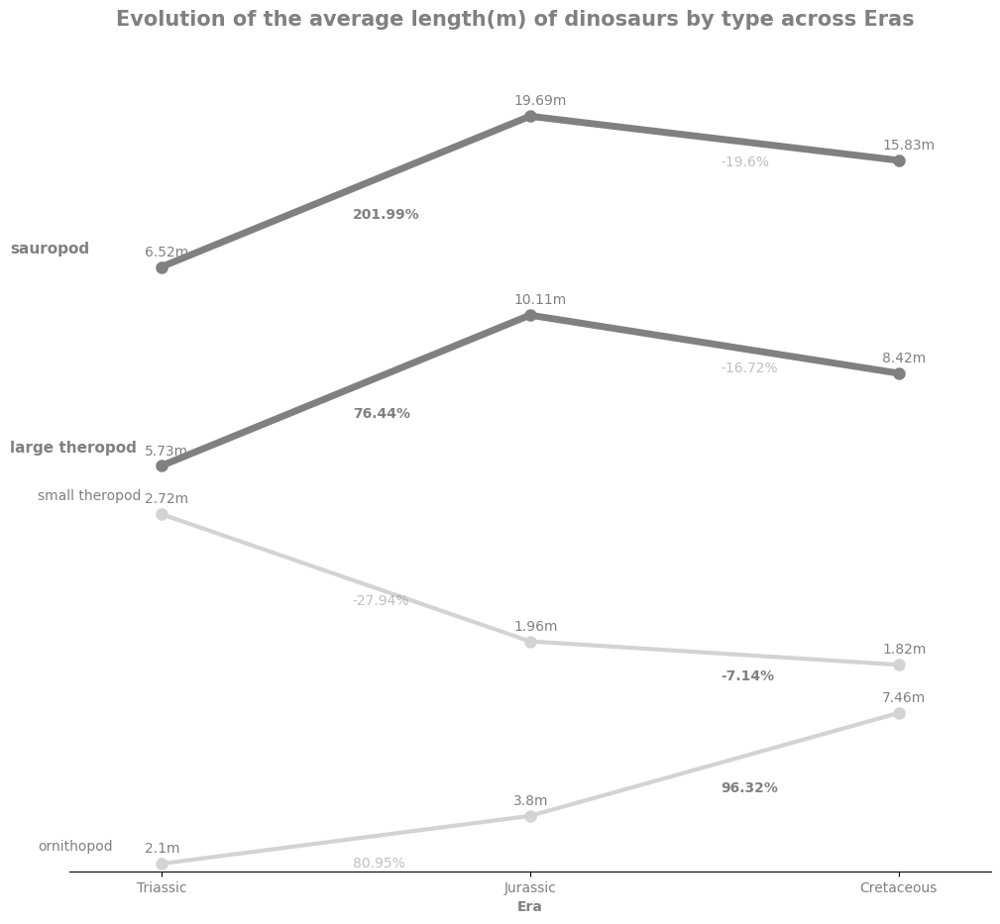

In [22]:
#plot of average length by type across Eras
n_types = dino_by_era[0]['type'].value_counts().index
evolution_by_type = pd.DataFrame(columns=['type','y_val','rel_change','highest'])
for d_type in n_types:
    n_unique_types = [round(era[era['type'] == d_type]['length_m'].mean(),2) for era in dino_by_era]
    n_unique_types_changes= calc_rel_change(n_unique_types)
    evolution_by_type.loc[len(evolution_by_type)] = [d_type,n_unique_types,n_unique_types_changes,np.argmax(n_unique_types_changes)]
    evolution_by_type.sort_values(by='highest',ascending=True,inplace=True)


fig,axes = plt.subplots(figsize=(12,10),nrows=len(n_types))
for ax,row in zip(axes.flat,evolution_by_type.iterrows()):
    content = row[1]
    line,x_val = plot_era(ax,content['y_val'],content['rel_change'],'m')
    # 
    # print(line)
    if content['highest'] == 0:
        line[0].set_color('grey')
        line[0].set_lw(5)
        ax.annotate(xy=(x_val[0],content['y_val'][0]),xytext=(-110,10),textcoords='offset points',text=content['type'],weight=900,color='grey',size=11)
    else:
        ax.annotate(xy=(x_val[0],content['y_val'][0]),xytext=(-90,10),textcoords='offset points',text=content['type'],color='grey')
    if content['type'] != evolution_by_type['type'].values[-1]:
        ax.spines['bottom'].set_visible(False)
        ax.xaxis.set_visible(False)

fig.suptitle('Evolution of the average length(m) of dinosaurs by type across Eras',weight=900,size=15,color='Grey')
plt.show()

### Conclusion

The analysis of the dinosaur dataset reveals several key insights into the diversity, size trends, and distribution of dinosaurs across different geological periods. The dataset comprises 4951 records representing 1042 different dinosaur species. Notably, the Supersaurus and Argentinosaurus are the longest dinosaurs recorded, each measuring 35.0 meters. However, missing data in crucial columns such as family, length, type, and diet affect 13.63% of the dataset, necessitating careful handling to maintain data integrity.

The most common dinosaur type is the ornithopods, which are primarily herbivorous and span a significant temporal range from 228 to 66 million years ago. A moderate positive correlation between dinosaur length and age suggests a trend of decreasing size over time, although this varies by type. For instance, ceratopsians, sauropods, and ornithopods show an increase in length from the Triassic to the Cretaceous periods.

Regionally, North America, particularly Alberta, holds the highest number of fossil records, with a notable outlier in England. Diet and type consistency are high across most dinosaur families, with a few exceptions such as Therizinosauridae and Oviraptoridae.

The Jurassic era stands out as a critical period for dinosaur evolution, marked by a significant increase in size and diversity compared to the Triassic. This era is often regarded as the golden age of dinosaurs, despite the Cretaceous having a higher overall number of different names, families, and types.

### Recommendations

- Develop robust imputation techniques to fill missing values in crucial columns (family, length, type, diet). Exploring patterns and relationships between known values can guide accurate imputations.

- Conduct detailed studies on size trends within specific dinosaur types, especially those with negative correlations like ceratopsians and sauropods, to understand their evolutionary pathways better.

- Increase efforts to discover and analyze fossils from the Triassic era, as these records are currently underrepresented and crucial for understanding the early stages of dinosaur evolution.

- Continue and expand paleontological excavations in regions with high fossil concentrations like Alberta, and also explore other potential rich sites, especially those with fewer known records, to uncover new species and data.

- Investigate the exceptions in diet and type consistency within families such as Therizinosauridae and Oviraptoridae to uncover any ecological or evolutionary reasons behind these variations.

- Enhance public understanding and appreciation of dinosaur evolution, focusing on the significance of different eras, especially the Jurassic period's role in the diversification and gigantism of dinosaurs.


# Insights into Movie Industry Dynamics: Analyzing Data from 4968 Entries
<img src="films.jpg" width=1000 height=600><br>
Image gotten from <a href='https://getwallpapers.com/collection/filmmaking-wallpaper' >Getwallpapers</a>


### Key Findings
- Out of the 4968 entries in the database, there are 4844 unique movies, indicating 124 duplicates, which have been removed.
- There are 791 rows with missing values for gross and 425 rows for budget. An imputation strategy is recommended to estimate these missing values, potentially using averages of similar entries. If some values cannot be imputed, those instances should be dropped.
- There are 12 different certificates in the database.
- The top five countries in the dataset are USA (3656), UK (429), France (153), Canada (121), and Germany (94), indicating a majority of movies are produced in the USA.
- The average duration for English-language movies is 107.51 minutes, while for French-language movies, it is 104.67 minutes, suggesting similar lengths.
- **Top Movies by Profit**:
   - **Star Wars: Episode VII - The Force Awakens** ($691.6 million)
   - **Avatar** ($523.5 million)
   - **Jurassic World** ($502.2 million)
   - **Titanic** ($458.7 million)
   - **Star Wars: Episode IV - A New Hope** ($499.9 million)
- **Top Movies by Net Profit**:
   - **Paranormal Activity** (719,348.6%)
   - **Tarnation** (217,466%)
   - **The Blair Witch Project** (234,116.9%)
   - **The Brothers McMullen** (40,886%)
   - **The Texas Chain Saw Massacre** (36,842.7%)

   The disparity between top profit and net profit movies is due to budget differences. High-budget movies generate substantial profits but rarely achieve high net profit percentages seen in low-budget films.
- **Best Movies by Country**:
   - **USA**: *Star Wars: Episode VII - The Force Awakens* ($691.6 million profit)
   - **UK**: *Harry Potter and the Sorcerer's Stone* ($192.56 million profit)
   - **France**: *Taken* ($120 million profit)
   - **Canada**: *X-men 2* ($104.95 million profit)
   - **Germany**: *Nacho Libre* ($48.2 million profit)
- **Best Movies by Certification**:
   - **R**: *Deadpool* ($305.02 million profit)
   - **PG-13**: *Star Wars: Episode VII - The Force Awakens*
   - **PG**: *Star Wars: Episode IV - A New Hope* ($449.94 million profit)
   - **NR (Not Rated)**: *West Side Story* ($37.65 million profit)
   - **G**: *The Lion King* ($377.78 million profit)
   - **NC-17**: *A Nightmare on Elm Street 3: Dream Warriors* ($40.29 million profit)
- The correlation coefficient between profit_loss and budget is -0.95, indicating a strong negative correlation. Lower budgets tend to result in higher profits.
- Successful movies have an average budget of $35.99 million, while unsuccessful movies average $54.99 million, suggesting that poor budget estimation contributes to financial losses.
- Movies with durations of 4-5 hours have a success rate of 22.2%.
- Movies over 6 hours have a 0% success rate.
- Movies under one hour have a low success rate of 6.4%.
- There is a profit spike in 1937 followed by a decline, with a notable consistent decline in profits and growth in budgets after 1993. This suggests consistent overbudgeting since 1993, emphasizing the need for accurate budget estimation.
- The USA has the highest profit rate at 46.8%, followed by the UK at 31.7%, Germany at 30.9%, Canada at 19.8%, and France at 15.7%.

### 2.1 Background
You have just been hired by a large movie studio to perform data analysis. Your manager, an executive at the company, wants to make new movies that "recapture the magic of old Hollywood." So you've decided to look at the most successful films that came out before Titanic in 1997 to identify patterns and help generate ideas that could turn into future successful films.

### 2.2 Objectives
Help your team leader understand the data that's available in the _cinema.films_ dataset. Include:

1. How many movies are present in the database?
2. There seems to be a lot of missing data in the gross and budget columns. How many rows have missing data? What would you recommend your manager to do with these rows?
3. How many different certifications or ratings are present in the database?
4. What are the top five countries in terms of number of movies produced?
5. What is the average duration of English versus French movies? (Don't forget you can use the AI assistant!)
6. Any other insights you found during your analysis?

### 2.3 Data Description
The data was sourced from [IMDb](https://www.imdb.com/).
| Column name | Description |
|---|---|
| id | Unique movie identifier. |
| title | The title of the movie. |
| release_year | The year the movie was released to the public. |
| country | The country in which the movie was released. |
| duration | The runtime of the movie, in minutes. |
| language | The original language the movie was produced in. |
| certification | The [rating](https://simple.wikipedia.org/wiki/Motion_Picture_Association_film_rating_system) the movie was given based on their suitability for audiences. |
| gross | The revenue the movie generated at the box office, in USD. |
| budget | The available budget the production had for producing the movie, in USD. |

### 2.4 Exploratory Data Analysis

In [43]:
films = pd.read_csv('datasets/films.csv')
films.describe()

,id,release_year,duration,gross,budget
count,4968.000000,4926.000000,4955.000000,4.158000e+03,4.538000e+03
mean,2484.500000,2002.466098,107.947931,4.870511e+07,3.990283e+07
std,1434.282399,12.470683,23.490189,6.982501e+07,2.064232e+08
min,1.000000,1916.000000,7.000000,1.620000e+02,2.180000e+02
25%,1242.750000,1999.000000,94.000000,5.354373e+06,6.000000e+06
50%,2484.500000,2005.000000,104.000000,2.552969e+07,2.000000e+07
75%,3726.250000,2011.000000,118.000000,6.232050e+07,4.500000e+07
max,4968.000000,2016.000000,334.000000,9.366274e+08,1.221550e+10


In [24]:
films.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4968 entries, 0 to 4967
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             4968 non-null   int64  
 1   title          4968 non-null   object 
 2   release_year   4926 non-null   float64
 3   country        4966 non-null   object 
 4   duration       4955 non-null   float64
 5   language       4955 non-null   object 
 6   certification  4666 non-null   object 
 7   gross          4158 non-null   float64
 8   budget         4538 non-null   float64
dtypes: float64(4), int64(1), object(4)
memory usage: 349.4+ KB


### 2.5 Main Findings

#### 1. How many movies are present in the database?
Out of the 4968 entries in the database, there are 4844 unique movies. This indicates that 124 movies were duplicates, which have been removed from the dataset.

In [25]:
print(f"There are {films['title'].unique().shape[0]} different films")

There are 4844 different films


In [26]:
films = films[[not i for i in films[[i for i in films.columns if i != 'id']].duplicated()]]

#### 2. There seems to be a lot of missing data in the gross and budget columns. How many rows have missing data? What would you recommend your manager to do with these rows?

There are a total of 791 rows with missing values for gross and 425 rows for budget. To address this issue, I recommend employing an imputation strategy to estimate these missing values. One approach could involve computing the average of entries with similar features. However, it's essential to specifiy a range when filtering based on numeric columns, like release_year. Additionally, if an instance contains null values in the column used for filtering, it should be skipped. If no other entries share the same value after filtering, the column should also be skipped. After imputing missing values using this method, some null values may still persist. In such cases, dropping those instances containing null values would be prudent.

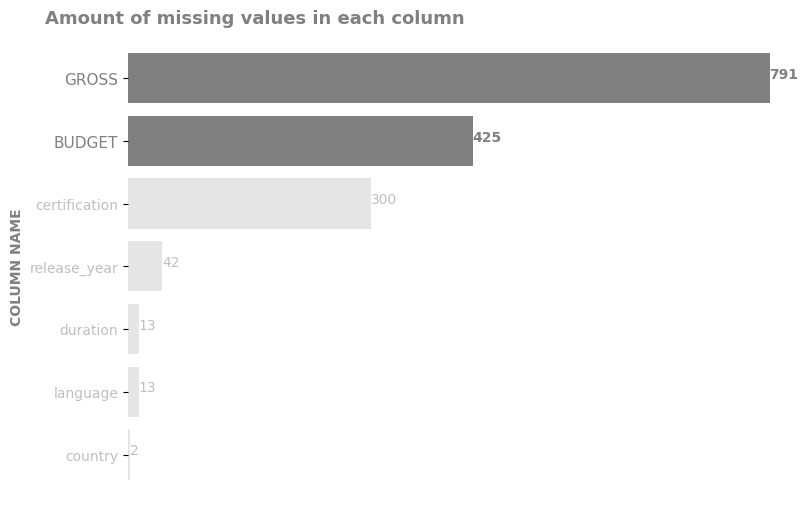

In [27]:
fig,axes = plt.subplots(figsize =(8,5),layout='constrained')
null_bud_gross = films.isnull().sum()
null_bud_gross = null_bud_gross.sort_values(ascending=False)
null_bud_gross = null_bud_gross[null_bud_gross != 0]
color_barh = [('grey',1) if i in ['gross','budget'] else ('grey',0.2) for i in null_bud_gross.index]
null_bud_gross.index = [i.upper() if i in ['gross','budget'] else i for i in null_bud_gross.index]
plot_barh
axes.barh(null_bud_gross.index,null_bud_gross.values,color=color_barh)
axes.invert_yaxis()
axes.spines[['top','left','right','bottom']].set_visible(False)
axes.xaxis.set_visible(False)
for ind,coord in enumerate(zip(null_bud_gross.items())):
    y,x = coord[0]
    tick = axes.yaxis.get_ticklabels()[ind]
    if color_barh[ind][1] == 1:
        axes.text(x,y,x,color=color_barh[ind],weight=900)
        tick.set_color(color_barh[ind])
        tick.set_size(11)
    else:
        c = (color_barh[ind][0],color_barh[ind][1]+0.3)
        tick.set_color(c)
        axes.text(x,y,x,color=c)
axes.set_ylabel('COLUMN NAME',color='grey',weight=900)
axes.set_title('Amount of missing values in each column',ha='right',color='grey',weight=900,size=13)
plt.show()

#### 3. How many different certifications or ratings are present in the database?

There are 12 different certificates in the database. While five certifications are currently being used by the Motion Picture Association (MPA), the reason for the abundance of certificates lies in the fact that some underwent updates over time. Specifically, GP and M certifications have evolved into PG, while X has been updated to NC-17.

Moreover, it's worth noting that Approved and Passed certifications were primarily used for pre-1968 titles under the Hays Code era. Lastly, the Unrated and Not Rated designations refer to movies that were released without receiving a specific certificate.

There are 12 different certificates in the dataset


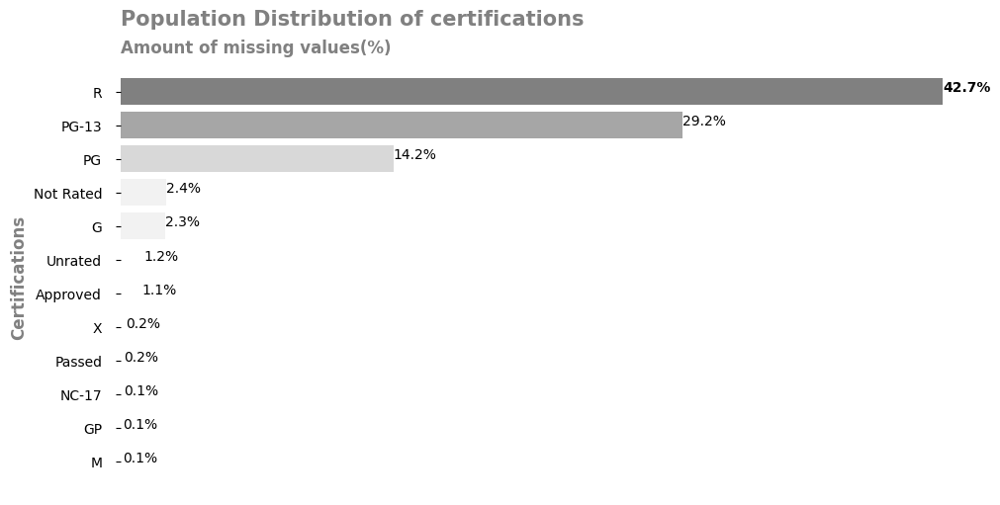

In [28]:
plot_barh
# films.loc[['certification'] == 'X','certification'] = 'NC-17'
pop_cert = (films['certification'].value_counts() / films.shape[0]) * 100
print(f"There are {len(pop_cert.index)} different certificates in the dataset")
plot_barh(pop_cert,'Population Distribution of certifications',['Amount of missing values(%)','Certifications'])

#### 4. What are the top five countries in terms of number of movies produced?
The top five countries represented in the dataset, along with the number of movies from each, are as follows: USA (3656), UK (429), France (153), Canada (121), and Germany (94). This distribution clearly indicates that the majority of movies in the dataset are produced in the USA.

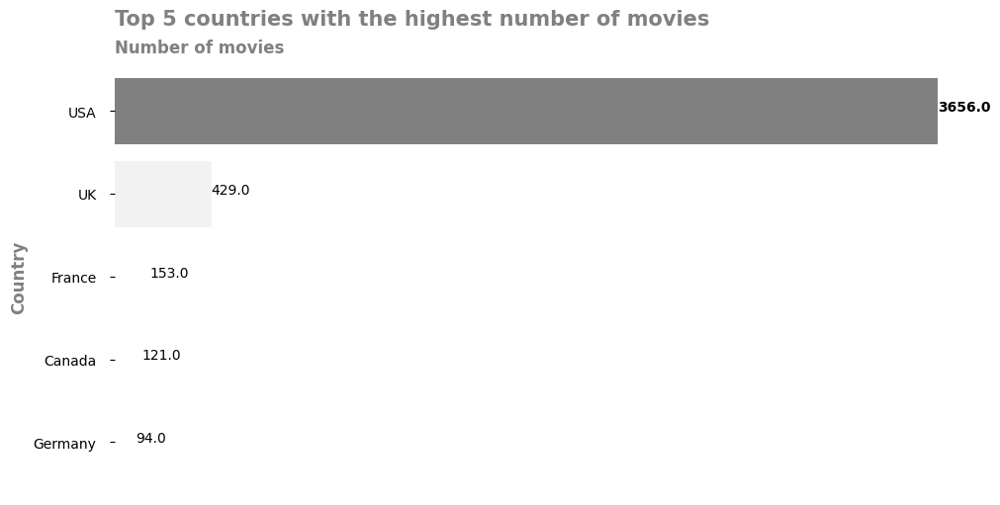

In [29]:
num_country = films['country'].value_counts()[:5]
plot_barh(num_country,'Top 5 countries with the highest number of movies',["Number of movies",'Country'],suffix='')

#### 5. What is the average duration of English versus French movies? (Don't forget you can use the AI assistant!)
The average duration for English-language movies is 107.51 minutes, while for French-language movies, it is 104.67 minutes. This suggests that the lengths of movies in these languages are fairly similar.

In [30]:
avg_english = round(films[films['language'] == 'English']['duration'].mean(),2)
avg_french = round(films[films['language'] == 'French']['duration'].mean(),2)
print(f"Englich language average movies is {avg_english} minutes, while French language movies is {avg_french} minutes")

Englich language average movies is 107.51 minutes, while French language movies is 104.67 minutes


### 6. Any other insights you found during your analysis?
Before diving into further analysis, several new features were extracted from existing columns. These new columns include:

- **duration_category**: This categorizes the duration of movies into intervals of one hour. For example, a value of 1 indicates the movie is less than one hour long, and a value of 2 means the movie is between one and two hours long.

- **profit_loss**: This was calculated by subtracting the gross from the budget. A negative value indicates a loss, while a positive value indicates a profit.

- **net_profit**: This metric was calculated using the budget as the basis with the formula $ \frac{profit\_loss}{budget} \times 100 $. This can be interpreted as the percentage of profit made relative to the budget.

Additionally, old certification values were updated to their current equivalents. Specifically:
- **Approved** and **Passed** were updated to **PG-13**.
- **Not Rated** and **Unrated** were updated to **NR** (Not Rated).
- **GP** and **M** were updated to **PG**.
- **X** was updated to **NC-17**.

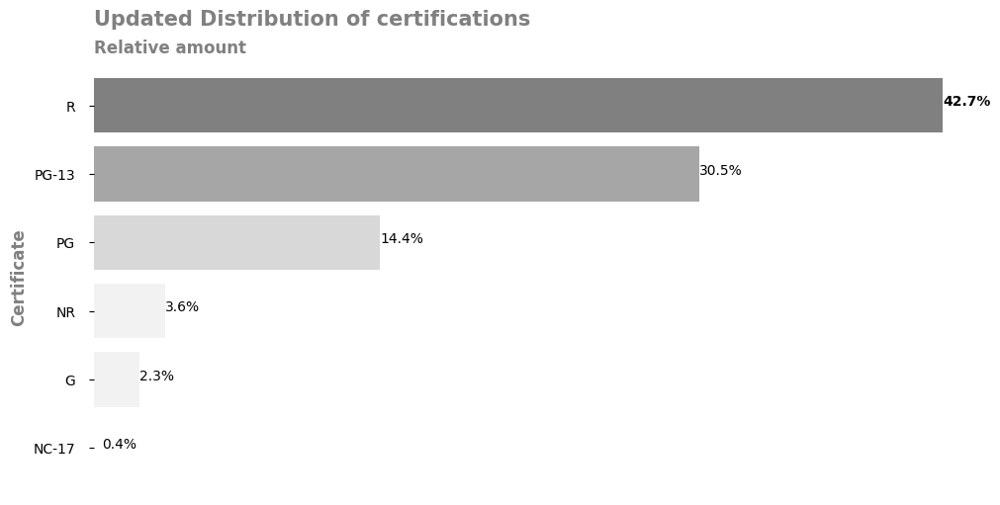

In [31]:
films['duration_category'] = films['duration'].map(lambda i : np.ceil(i / 60))
films['profit_loss'] = films['gross'] - films['budget']
films['net_profit'] = round((films['profit_loss'] / films['budget']) * 100,2)
films.loc[(films['certification'] == 'Not Rated') | (films['certification'] == 'Unrated'),'certification'] = 'NR'
films.loc[(films['certification'] == 'Approved') | (films['certification'] == 'Passed'),'certification'] = 'PG-13'
films.loc[(films['certification'] == 'GP') | (films['certification'] == 'M'),'certification'] = 'PG'
films.loc[films['certification'] == 'X','certification'] = 'NC-17'
cert_distr = films['certification'].value_counts() / films.shape[0] * 100
plot_barh(cert_distr,'Updated Distribution of certifications',['Relative amount','Certificate'])



#### 6.1 Movies and Their Profit

#### Top Movies by Profit
The movie that made the most profit is **Star Wars: Episode VII - The Force Awakens** with a staggering $691.6 million. Following it are:
- **Avatar** ($523.5 million)
- **Jurassic World** ($502.2 million)
- **Titanic** ($458.7 million)
- **Star Wars: Episode IV - A New Hope** ($499.9 million)

#### Top Movies by Net Profit
However, the top movies based on net profit tell a different story:
- **Paranormal Activity** (719,348.6%)
- **Tarnation** (217,466%)
- **The Blair Witch Project** (234,116.9%)
- **The Brothers McMullen** (40,886%)
- **The Texas Chain Saw Massacre** (36,842.7%)

None of these titles are as well-known as the top profit movies.The disparity between the top movies by profit and those by net profit isn't due to their popularity but rather their budgets. The average budget for the top five movies by profit is $168.6 million. This high budget makes it difficult for their net profit percentages to match those of the top net profit movies, which have much lower budgets, averaging just $36,750. This lower budget provides more room for the net profit to grow significantly.Therefore, while high-budget movies can generate substantial profits, they rarely achieve the extraordinary net profit percentages seen in low-budget films.

'Average budget for top movies by profit 168.6,Average budget for top movies by net_profit 36750.0'

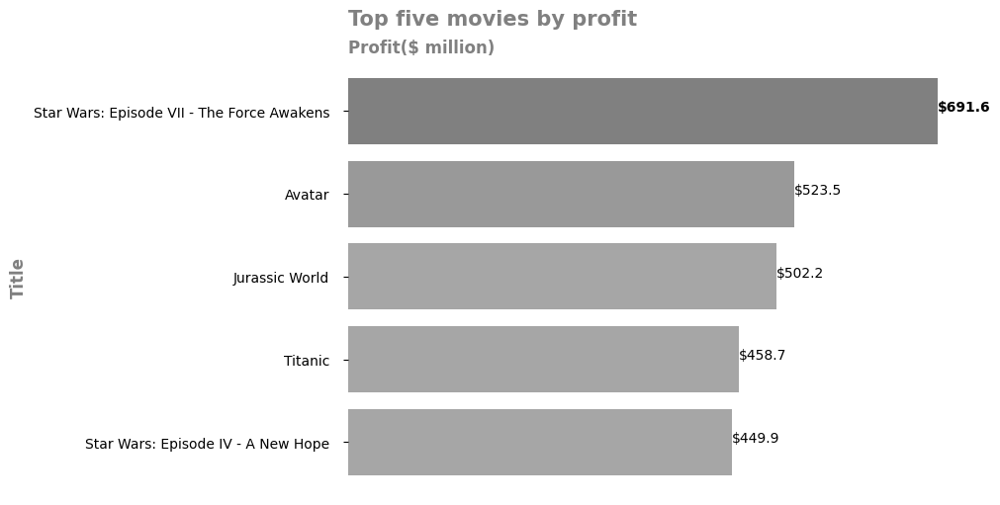

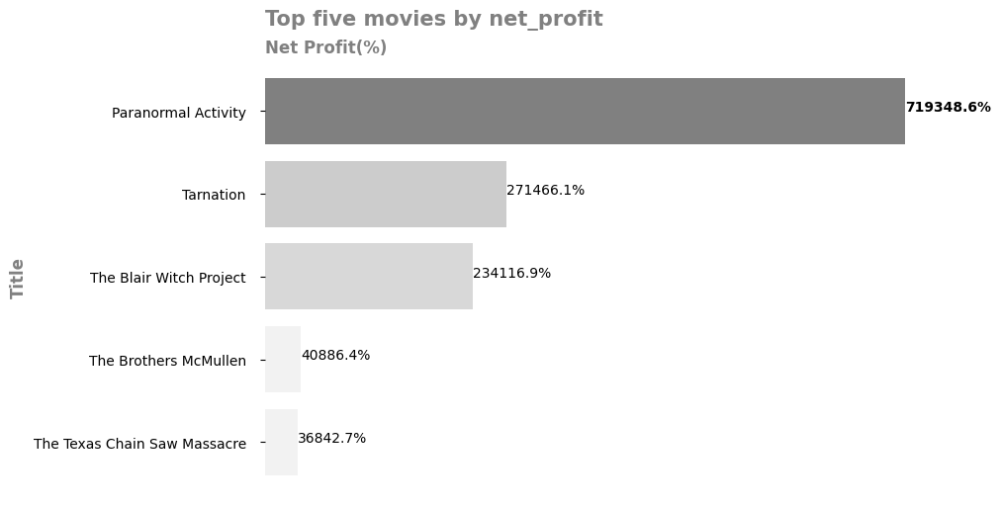

In [32]:
top_five_movies_by_profit = films.sort_values(by='profit_loss',ascending=False)[:5]
avg_budget = top_five_movies_by_profit['budget'].mean()
top_five_movies_by_profit = pd.Series(top_five_movies_by_profit['profit_loss'].apply(lambda x : round(x / 1000000,2)).values,index=top_five_movies_by_profit['title'])
plot_barh(top_five_movies_by_profit,'Top five movies by profit',['Profit($ million)','Title'],prefix='$',suffix='')

top_five_movies_by_nprofit = films.sort_values(by='net_profit',ascending=False)[:5]
avg_budget_nprofit = top_five_movies_by_nprofit['budget'].mean()
top_five_movies_by_nprofit = pd.Series(top_five_movies_by_nprofit['net_profit'].values,index=top_five_movies_by_nprofit['title'])
plot_barh(top_five_movies_by_nprofit,'Top five movies by net_profit',['Net Profit(%)','Title'])
f"Average budget for top movies by profit {avg_budget / 1000000},Average budget for top movies by net_profit {avg_budget_nprofit}"

#### 6.2 Best Movies Produced for Each Country and Certification

To determine the best movies produced for each country and certification, we will use the **profit_loss** column. This is because higher profits often indicate greater popularity and success.

##### Best Movies by Country
- **USA**: *Star Wars: Episode VII - The Force Awakens* ($691.6 million profit)
- **UK**: *Harry Potter and the Sorcerer's Stone* ($192.56 million profit)
- **France**: *Taken* ($120 million profit)
- **Canada**: *X-men 2* ($104.95 million profit)
- **Germany**: *Nacho Libre* ($48.2 million profit)

##### Best Movies by Certification
- **R**: *Deadpool* ($305.02 million profit)
- **PG-13**: *Star Wars : Episode VII - The Force Awakens*
- **PG**: *Star Wars : Episode IV - A New Hope* ($449.94 million profit)
- **NR** (Not Rated): *West Side story* ($37.65 million profit)
- **G**: *The Lion King* ($377.78 million profit)
- **NC-17**: *A Nightmare on Elm Street 3: Dream Warriors* ($40.29 million profit)

**Star Wars** movies dominate the USA category and the PG-13 and PG certifications due to their immense popularity and profitability.

In [33]:
x = films['country'].value_counts()[:5]
print("Best movies by the top five countries")
for c in x.index:
    d = films[films['country'] == c].sort_values(by='profit_loss',ascending=False)
    print(f'{c}  :  {d['title'].values[0]}({round(d['profit_loss'].values[0] /1000000,2)})')
print('\n')
print("Best Movies by certifications")
x = films['certification'].value_counts()[:10]
for c in x.index:
    d = films[films['certification'] == c].sort_values(by='profit_loss',ascending=False)
    print(f'{c}  :  {d['title'].values[0]},{round(d['profit_loss'].values[0] / 1000000,2)}')

Best movies by the top five countries
USA  :  Star Wars: Episode VII - The Force Awakens(691.63)
UK  :  Harry Potter and the Sorcerer's Stone(192.56)
France  :  Taken(120.0)
Canada  :  X-Men 2(104.95)
Germany  :  Nacho Libre(48.2)


Best Movies by certifications
R  :  Deadpool,305.02
PG-13  :  Star Wars: Episode VII - The Force Awakens,691.63
PG  :  Star Wars: Episode IV - A New Hope,449.94
NR  :  West Side Story,37.65
G  :  The Lion King,377.78
NC-17  :  A Nightmare on Elm Street 3: Dream Warriors,40.29


#### 6.3 Correlation Analysis and Insights
The correlation coefficients of profit_loss and net_profit against budget and gross was examined. The most attention-grabbing finding was the very strong negative correlation of -0.95 between profit_loss and budget. This indicates that lower budgets tend to result in higher profits. However, does this mean producers should always aim for very low-budget movies to maximize profits?<br>
To answer this, we compared the average budgets of successful and unsuccessful movies:
- **Average budget for successful movies**: $35.99 million
- **Average budget for unsuccessful movies**: $54.99 million

This analysis reveals that unsuccessful movies often have poorly estimated budgets, leading to losses. Thus, it's advised that movie producers should carefully estimate budgets to maximize their chances of profitability. However, it’s crucial to recognize that budget estimation is only one factor in a movie's success.

#### Other Factors Affecting Movie Success
1. **Movie Duration**:
   - Movies with a duration of 4-5 hours had a success rate of 22.2%.
   - Movies longer than 6 hours had a 0% success rate.
   - Movies shorter than one hour had a low success rate of 6.4%.

   These findings suggest that excessively long or very short movies tend to be less successful. Therefore, considering the optimal length of a movie can be important for its success.

2. **Story Richness and Portrayal**:
   - An intuitive factor for a movie's success is the richness of its story and how well it is portrayed. Unfortunately, the dataset does have the required features.

Average budget for successful movies is $35.99 million, while the unsuccessful movies is $54.47 million


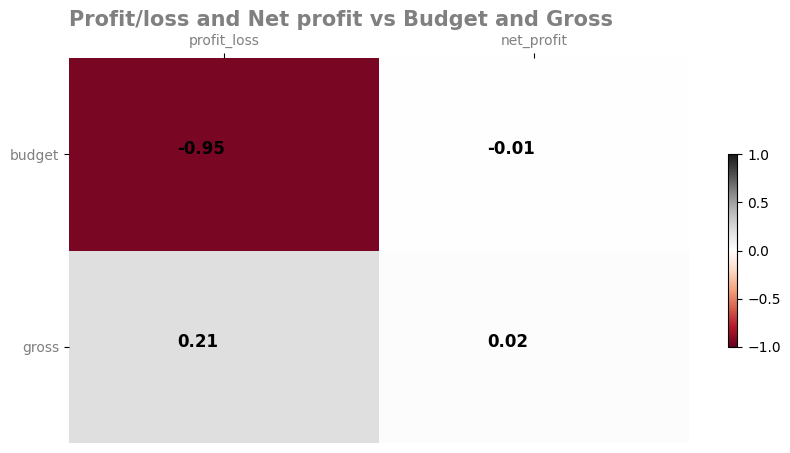

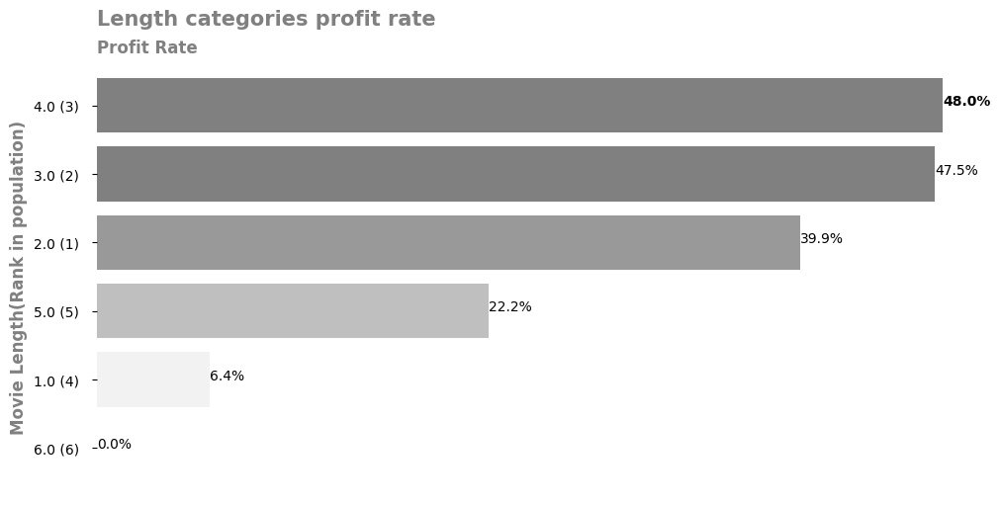

In [34]:
corr_new_feature = films[['gross','budget','profit_loss','net_profit']].corr(numeric_only=True,min_periods=0.5)
corr_new_feature = corr_new_feature[(corr_new_feature.index != 'profit_loss') & (corr_new_feature.index != 'net_profit')][['profit_loss','net_profit']]
fig,axes = plt.subplots(figsize=(10,5))
plot_mesh(corr_new_feature,'Profit/loss and Net profit vs Budget and Gross',fig,axes,('',''),cbar=True,vmin=-1,vmax=1)
success_mov_bud = round(films[films['profit_loss'] > 0]['budget'].mean() / 1000000,2)
unsuccess_mov_bud =round(films[films['profit_loss'] <= 0]['budget'].mean() / 1000000,2)
print(f"Average budget for successful movies is ${success_mov_bud} million, while the unsuccessful movies is ${unsuccess_mov_bud} million")

duration_cat = films['duration_category'].value_counts()
duration_cat_profit_rate = []
for country in duration_cat.index:
    data = films[films['duration_category'] == country]
    duration_cat_profit_rate.append(round((data[data['profit_loss'] > 0].shape[0] / data.shape[0]) * 100,2))
duration_cat_profit_rate = pd.Series(duration_cat_profit_rate,index=[ f'{cat} ({ind+1})' for ind,cat in enumerate(duration_cat.index)])
duration_cat_profit_rate.sort_values(ascending=False,inplace=True)
plot_barh(duration_cat_profit_rate,'Length categories profit rate',('Profit Rate','Movie Length(Rank in population)'))

#### 6.4 The average annual budget and profits of movies
The graph shows a profit spike in 1937, followed by a decline, with a notable consistent decline in profit and growth in budgets after 1993. This indicates that movies have been consistently overbudgeted since 1993, emphasizing the need for accurate budget estimation. To estimate budgets, a machine learning model can be used by filtering profitable movies, selecting relevant features (excluding profit_loss, gross, net_profit), preprocessing data, splitting it into training and testing sets, and training and evaluating the model. However, this approach is limited by insufficient data and the need for more features like the number of cast and crew members, release season to improve accuracy. Proper budget estimation is essential to avoid overbudgeting and ensure movie success.

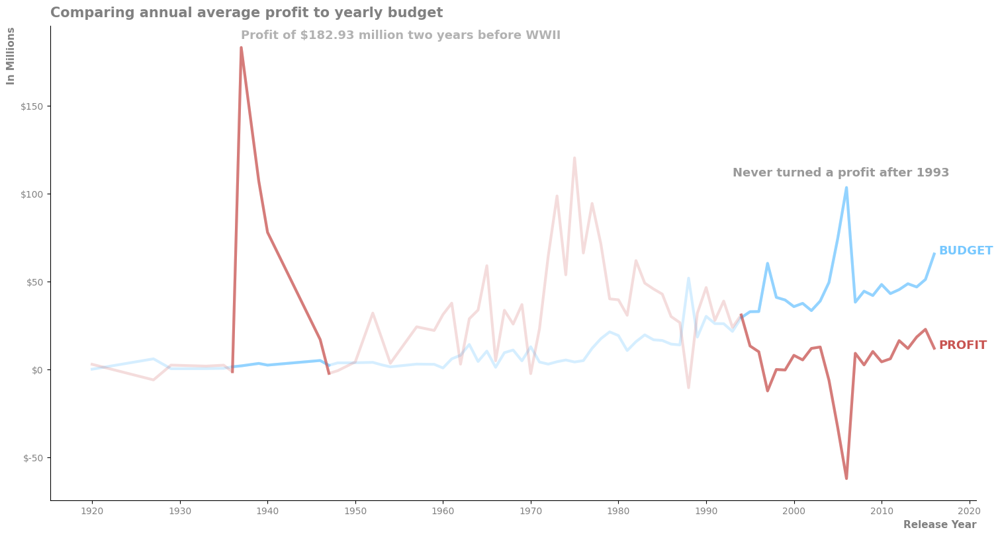

In [35]:
def for_each(data,ind_col,val_col,compute):
    data_ctab = pd.crosstab(data[ind_col],data[val_col])
    if compute == 'mean':
        return data_ctab.apply(lambda i: f_mean(i), axis=1)
    elif compute == 'max':
        return data_ctab.apply(lambda i: f_max(i), axis=1)
    elif compute == 'min':
        return data_ctab.apply(lambda i: f_min(i), axis=1)

fig,axes = plt.subplots(figsize=(15,8),layout='constrained')
data = films.dropna(subset='profit_loss')
avg_budget_by_year = round(for_each(data,'release_year','budget','mean') / 1000000,2)
avg_profit_by_year = round(for_each(data,'release_year','profit_loss','mean') / 1000000,2)
golden_age_budget = avg_budget_by_year[(avg_budget_by_year.index > 1935) & (avg_budget_by_year.index < 1948)]
golden_age_profit = avg_profit_by_year[(avg_profit_by_year.index > 1935) & (avg_profit_by_year.index < 1948)]
dark_age_budget = avg_budget_by_year[avg_budget_by_year.index > 1993]
dark_age_profit = avg_profit_by_year[avg_profit_by_year.index > 1993]

def plot_series(ax,x,y,**kwargs):
    ax.plot(x,y,**kwargs)

plot_series(axes,avg_budget_by_year.index,avg_budget_by_year.values,c='#77C8FF',lw=3,alpha=0.3)
plot_series(axes,avg_profit_by_year.index,avg_profit_by_year.values,c='#C85451',lw=3,alpha=0.2)
plot_series(axes,golden_age_budget.index,golden_age_budget.values,c='#77C8FF',lw=3,alpha=0.7)
plot_series(axes,golden_age_profit.index,golden_age_profit.values,c='#C85451',lw=3,alpha=0.7)
plot_series(axes,dark_age_budget.index,dark_age_budget.values,c='#77C8FF',lw=3,alpha=0.7)
plot_series(axes,dark_age_profit.index,dark_age_profit.values,c='#C85451',lw=3,alpha=0.7)


axes.annotate(xy=(avg_budget_by_year.index[-1],avg_budget_by_year.values[-1]),textcoords='offset points',xytext=(5,0),text='BUDGET',size=13,color='#77C8FF',weight=700)
axes.annotate(xy=(avg_profit_by_year.index[-1],avg_profit_by_year.values[-1]),textcoords='offset points',xytext=(5,0),text='PROFIT',size=13,color='#C85451',weight=700)


highest_pt = golden_age_profit.max()
golden_year = golden_age_profit[golden_age_profit == highest_pt].index[0]
axes.text(x=golden_year,y=highest_pt+5,s=f"Profit of ${highest_pt} million two years before WWII",wrap=True,size=13,c='grey',weight=600,alpha=0.6)

axes.text(x=1993,y=110,s='Never turned a profit after 1993',wrap=True,size=13,c='grey',weight=600,alpha=0.8)


x_lbl = np.arange(1920,2030,10)
y_lbl = ['$' + str(int(i)) for i in axes.get_yticks()[1:-1]]
axes.set_xticks(x_lbl)
axes.tick_params('both',labelcolor='grey')
axes.set_yticks(axes.get_yticks()[1:-1],labels=y_lbl)
axes.spines[['top','right']].set_visible(False)

axes.set_xlabel('Release Year',weight=700,color='grey',loc='right',size=11)
axes.set_ylabel('In Millions', weight=700, color='grey',loc='top',size=11)
axes.set_title('Comparing annual average profit to yearly budget', weight=700, color='grey', size=15,loc='left',pad=10)


plt.show()



#### 6.5 Profit rate by country
Within the top five countries, the USA has the highest profit rate at 46.8%, followed by the UK at 31.7%. Germany has a profit rate of 30.9%, displacing France, which has the lowest profit rate among them at 15.7%. Lastly, Canada retains its position as the fourth with a profit rate of 19.8%.

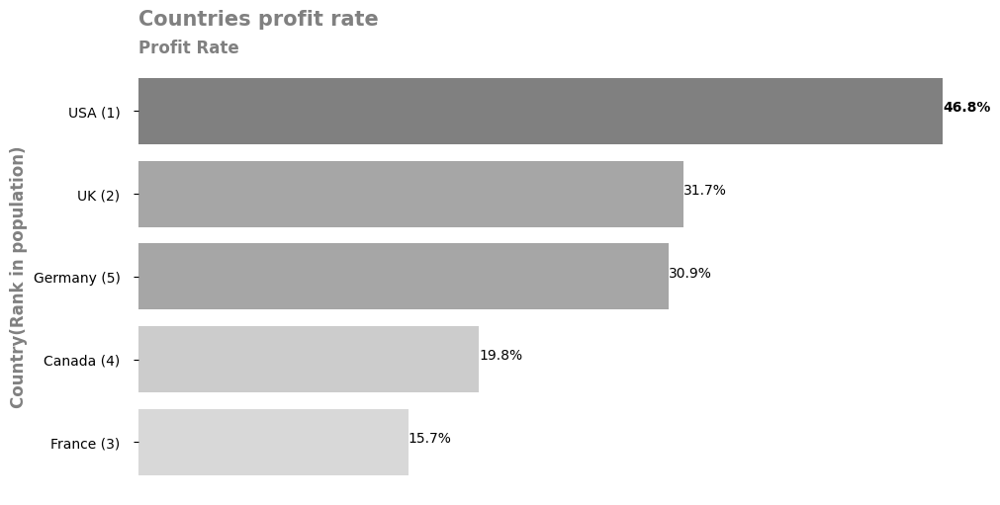

In [36]:
top_ten_countries = films['country'].value_counts()[:5]
countries_profit_rate = []
for country in top_ten_countries.index:
    data = films[films['country'] == country]
    countries_profit_rate.append(round((data[data['profit_loss'] > 0].shape[0] / data.shape[0]) * 100,2))
countries_profit_rate = pd.Series(countries_profit_rate,index=[ f'{country} ({ind+1})' for ind,country in enumerate(top_ten_countries.index)])
countries_profit_rate = countries_profit_rate.sort_values(ascending=False)
plot_barh(countries_profit_rate,'Countries profit rate',('Profit Rate','Country(Rank in population)'))

### Conclusions
- The dataset provides valuable insights into the film industry, including movie certifications, country representation, and duration trends.

- Profit rates vary across countries, with the USA leading at 46.8%, followed by the UK, Germany, Canada, and France.

- While high-budget movies may generate substantial profits, they rarely achieve the extraordinary net profit percentages seen in low-budget films.

- Movie certifications have evolved over time, with some certifications being updated or phased out, reflecting changing industry standards.

- Factors like budget estimation, movie duration, and storytelling richness play crucial roles in a movie's success.

- Proper budget estimation is essential to avoid overbudgeting and financial losses.

### Recommendations

- Regularly update and maintain the dataset to capture evolving industry trends and certification dynamics.

- Improve budget estimation accuracy by leveraging machine learning models trained on relevant features. Consider factors like cast size, crew involvement, genre, and release season to enhance accuracy.

- Ensure that movie durations align with audience preferences, typically ranging between 1-3 hours. Avoid excessively long or short movies to maximize success potential.

- Focus on creating compelling and rich storylines, supported by talented actors, directors, and high production values. Invest in marketing efforts to enhance movie visibility and audience engagement.

- Conduct comprehensive market analyses to identify emerging trends, audience preferences, and competitive landscapes. Adapt strategies accordingly to capitalize on market opportunities.

- Continuously monitor and evaluate movie performance metrics, including profitability, audience feedback, and critical acclaim. Use insights to refine strategies and optimize future movie projects.
